# Experimenting with astroid tracking

In [1]:
#from ipywidgets import interact, interactive, fixed, interact_manual
#import ipywidgets as widgets
%matplotlib notebook
import ipympl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
from astropy.io import fits
from glob import glob

from scipy.signal import convolve2d
from scipy.ndimage.filters import convolve
from scipy.interpolate import interp1d
from astropy.wcs import WCS
from tqdm import tnrange, tqdm_notebook
import warnings
warnings.filterwarnings("ignore",category = RuntimeWarning)


/Users/ryanr/anaconda3/lib/python3.5/site-packages/ipympl/__init__.py:25: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'nbAgg' by the following code:
  File "/Users/ryanr/anaconda3/lib/python3.5/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/Users/ryanr/anaconda3/lib/python3.5/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/Users/ryanr/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py", line 3, in <module>
    app.launch_new_instance()
  File "/Users/ryanr/anaconda3/lib/python3.5/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/Users/ryanr/anaconda3/lib/python3.5/site-packages/ipykernel/kernelapp.py", line 486, in start
    self.io_loop.start()
  File "/User

In [2]:

import matplotlib.animation as animation
import matplotlib.gridspec as gridspec
import numpy as np
from astropy.stats import sigma_clip

from scipy.ndimage.filters import convolve
from scipy.interpolate import interp1d

from astropy.io import fits
from astropy import units as u
from astropy.coordinates import SkyCoord
from astropy.wcs import WCS

from astroquery.simbad import Simbad
from astroquery.ned import Ned
from astroquery.ned.core import RemoteServiceError
from xml.parsers.expat import ExpatError
from astroquery.exceptions import TableParseError
from astropy import coordinates
import astropy.units as u
import csv

from glob import glob
import os
import time as t

import warnings
warnings.filterwarnings("ignore",category = RuntimeWarning)
warnings.filterwarnings("ignore",category = UserWarning)




def FindMinFrame(data,thrusters):
    # Finding the reference frame
    Framemin = data[thrusters[3]+1]
    return Framemin

def ObjectMask(datacube,Framemin):
    # Make a mask of the target object, using the reference frame 
    Mask = datacube[Framemin,:,:]/(np.nanmedian(datacube[Framemin,:,:])+np.nanstd(datacube[Framemin,:,:]))
    Mask[Mask>=1] = np.nan
    Mask[Mask<1] = 1
    # Generate a second mask from remainder of the first. This grabs the fainter pixels around known sources
    Maskv2 = datacube[Framemin,:,:]*Mask/(np.nanmedian(datacube[Framemin,:,:]*Mask)+np.nanstd(datacube[Framemin,:,:]*Mask))
    Maskv2[Maskv2>=1] = np.nan
    Maskv2[Maskv2<1] = 1
    return Maskv2

def ThrustObjectMask(data,thrust):
    StartMask = np.ones((data.shape[1],data.shape[2]))
    for i in range(2):
        Start = data[thrust[:3]+1]*StartMask/(np.nanmedian(data[thrust[:3]+1]*StartMask, axis = (1,2))+np.nanstd(data[thrust[:3]+1]*StartMask, axis = (1,2)))[:,None,None]
        Start = Start >= 1
        temp = (np.nansum(Start*1, axis = 0) >=1)*1.0
        temp[temp>=1] = np.nan
        temp[temp<1] = 1
        StartMask = StartMask*temp


    EndMask = np.ones((data.shape[1],data.shape[2]))
    for i in range(2):
        End = data[thrust[-3:]+1]*EndMask/(np.nanmedian(data[thrust[-3:]+1]*EndMask, axis = (1,2))+np.nanstd(data[thrust[-3:]+1]*EndMask, axis = (1,2)))[:,None,None]
        End = End >= 1
        temp = (np.nansum(End*1, axis = 0) >=1)*1.0
        temp[temp>=1] = np.nan
        temp[temp<1] = 1
        EndMask = EndMask*temp
    
        
    Mask = np.nansum([np.ma.masked_invalid(StartMask).mask,np.ma.masked_invalid(EndMask).mask],axis=(0))*1.0
    Mask[Mask!=2] = 1
    Mask[Mask==2] = np.nan
    return Mask

def Event_ID(Eventmask,Mask):
    tarr = np.copy(Eventmask)
    leng = 10
    X = np.where(Mask)[0]
    Y = np.where(Mask)[1]

    for i in range(10-2):
        kern = np.zeros((leng,1,1))
        kern[[0,-1]] = 1
        tarr[convolve(tarr*1,kern) > 1] = True
        leng -= 1

    events = []
    eventtime = []
    eventmask = []

    for i in range(len(X)):
        temp = np.insert(tarr[:,X[i],Y[i]],0,False)
        testf = np.diff(np.where(~temp)[0])
        indf = np.where(~temp)[0]
        testf[testf == 1] = 0
        testf = np.append(testf,0)

        if len(indf[testf>3]+1) == 1:
            events.append(indf[testf>3][0])
            eventtime.append([indf[testf>3][0], (indf[testf>3][0] + testf[testf>3][0]-1)])
            masky = [np.array(X[i]), np.array(Y[i])]
            eventmask.append(masky)
        elif len(indf[testf>3]) > 1:
            for j in range(len(indf[testf>3])):
                events.append(indf[testf>3][j])
                eventtime.append([indf[testf>3][j], (indf[testf>3][j] + testf[testf>3][j]-1)])
                masky = [np.array(X[i]), np.array(Y[i])]
                eventmask.append(masky)

    events = np.array(events)
    eventtime = np.array(eventtime)
    return events, eventtime, eventmask



def Asteroid_fitter(Mask,Time,Data, plot = False):
    lc = np.nansum(Data*Mask,axis=(1,2))
    middle = np.where(np.nanmax(lc[Time[0]-1:Time[-1]+1]) == lc)[0][0]
    if abs(Time[0] - Time[1]) < 4:
        x = np.arange(middle-1,middle+1+1,1)
    else:
        x = np.arange(middle-2,middle+2+1,1)
    if x[-1] > len(lc) - 1:
        x = x[x<len(lc)]
    x2 = np.arange(0,len(x),1)
    if np.nanmedian(lc[x]) >0:
        y = lc[x]/np.nanmedian(lc[x])
        p1, residual, _, _, _ = np.polyfit(x,y,2, full = True)
        p2 = np.poly1d(p1)
        AvLeft = residual/len(x)#np.nansum(abs(lc[Time[0]:Time[-1]]/np.nanmedian(lc[x]) - p2(np.arange(Time[0],Time[-1]))))/(Time[-1]-Time[0])
        maxpoly = np.where(np.nanmax(p2(x)) == p2(x))[0][0]
        if (AvLeft < 10) &  (abs(middle - x[maxpoly]) < 2):
            asteroid = True
            if plot == True:
                p2 = np.poly1d(p1)
                plt.figure()
                plt.plot(x,y,'.',label='Event LC')
                plt.plot(x,p2(x),'kx',label='Parabola fit')
                plt.axvspan(Time[0],Time[1], color = 'orange',alpha=0.5, label = 'Event duration')
                plt.ylabel('Counts')
                plt.xlabel('Time')
                plt.legend()
                plt.title('Residual = ' + str(AvLeft))
                #plt.savefig('Asteroid_paper_example.pdf')
        else:
            asteroid = False
    else:
        asteroid = False

    return asteroid

def Smoothmax(interval,Lightcurve,qual):
    x = np.arange(interval[0],interval[1],1.)
    x[qual[interval[0]:interval[-1]]!=0] = np.nan 
    nbins = int(len(x)/5)
    y = np.copy(Lightcurve[interval[0]:interval[-1]])
    y[qual[interval[0]:interval[-1]]!=0] = np.nan
    
    if np.nansum(x) > 0:
        n, _ = np.histogram(x, bins=nbins,range=(np.nanmin(x),np.nanmax(x)))
        sy, _ = np.histogram(x, bins=nbins, weights=y,range=(np.nanmin(x),np.nanmax(x)))
        sy2, _ = np.histogram(x, bins=nbins, weights=y*y,range=(np.nanmin(x),np.nanmax(x)))
        mean = sy / n
        std = np.sqrt(sy2/n - mean*mean)

        xrange = np.linspace(np.nanmin(x),np.nanmax(x),len(x))
        y_smooth = np.interp(xrange, (_[1:] + _[:-1])/2, mean)
        y_smooh_error = np.interp(xrange, (_[1:] + _[:-1])/2, std)

        temp = np.copy(y)
        temp[y_smooh_error>10] =np.nan

        maxpos = np.where(temp == np.nanmax(temp))[0]+interval[0]
    else:
        maxpos = 0
    return maxpos

def ThrusterElim(Events,Times,Masks,Firings,Quality,qual,Data):
    temp = []
    temp2 = []
    temp3 = []
    asteroid = []
    asttime = []
    astmask = []
    for i in range(len(Events)):
        mask = np.zeros((Data.shape[1],Data.shape[2]))
        mask[Masks[i][0],Masks[i][1]] = 1
        Range = Times[i][-1] - Times[i][0]
        if (Range > 0) & (Range/Data.shape[0] < 0.8): 
            begining = Firings[(Firings >= Times[i][0]-2) & (Firings <= Times[i][0]+1)]
            if len(begining) == 0:
                begining = Quality[(Quality == Times[i][0])] #& (Quality <= Times[i][0]+1)]
            end = Firings[(Firings >= Times[i][-1]-1) & (Firings <= Times[i][-1]+2)]
            if len(end) == 0:
                end = Quality[(Quality == Times[i][-1])] #& (Quality <= Times[i][-1]+1)]
            eventthrust = Firings[(Firings >= Times[i][0]) & (Firings <= Times[i][-1])]

            if (~begining.any() & ~end.any()) & (Range < 48): # Change to the nominal cadences  for a day 
                
                if Asteroid_fitter(mask,Times[i],Data):
                    asteroid.append(Events[i])
                    asttime.append(Times[i])
                    astmask.append(Masks[i])
                else:
                    LC = Data[Times[i][0]:Times[i][-1]+3,Masks[i][0],Masks[i][1]]
                    if (np.where(np.nanmax(LC) == LC)[0] < Range).all():
                    
                        temp.append(Events[i])
                        temp2.append(Times[i])
                        temp3.append(Masks[i])

            elif Range >= 48:

                if begining.shape[0] == 0:
                    begining = 0
                else:
                    begining = begining[0]   
                if end.shape[0] == 0:
                    end = Times[i][-1] + 10
                else:
                    end = end[0]
                LC = Data[:,Masks[i][0],Masks[i][1]]
                #print(Masks[i])
                #print(LC.shape)
                maxloc = Smoothmax(Times[i],LC,qual)

                if ((maxloc > begining).all() & (maxloc < end)).all(): 
                    premean = np.nanmean(LC[eventthrust-1]) 
                    poststd = np.nanstd(LC[eventthrust+1])
                    postmean = np.nanmedian(LC[eventthrust+1])
                    Outsidethrust = Firings[(Firings < Times[i][0]) | (Firings > Times[i][-1]+20)]
                    Outsidemean = np.nanmedian(LC[Outsidethrust+1])
                    Outsidestd = np.nanstd(LC[Outsidethrust+1])
                    if  postmean > Outsidemean+2*Outsidestd:
                        temp.append(Events[i])
                        temp2.append(Times[i])
                        temp3.append(Masks[i])


    events = np.array(temp)
    eventtime = np.array(temp2)
    eventmask = temp3#np.array(temp3)
    return events, eventtime, eventmask, asteroid, asttime, astmask

def Asteroid_identifier(Events,Times,Masks,Firings,Quality,qual,Data):
    asteroid = []
    asttime = []
    astmask = []
    for i in range(len(Events)):
        Range = Times[i][-1] - Times[i][0]
        if (Range > 0) & (Range/Data.shape[0] < 0.8) & (Times[i][0] > 5): 
            begining = Firings[(Firings >= Times[i][0]-2) & (Firings <= Times[i][0]+1)]
            #if len(begining) == 0:
             #   begining = Quality[(Quality == Times[i][0])] #& (Quality <= Times[i][0]+1)]
            end = Firings[(Firings >= Times[i][-1]-1) & (Firings <= Times[i][-1]+2)]
            #if len(end) == 0:1
             #   end = Quality[(Quality == Times[i][-1])] #& (Quality <= Times[i][-1]+1)]
            eventthrust = Firings[(Firings >= Times[i][0]) & (Firings <= Times[i][-1])]

            if (~begining.any() & ~end.any()) & (len(eventthrust) < 3):
                
                if Asteroid_fitter(Masks[i],Times[i],Data):
                    asteroid.append(Events[i])
                    asttime.append(Times[i])
                    astmask.append(Masks[i])
                
    return asteroid, asttime, astmask


def Match_events(Events,Eventtime,Eventmask):
    i = 0
    eventmask2 = []
    while len(Events) > i:
        
        coincident = (np.isclose(Eventtime[i,0],Eventtime[i:,0],atol=5) + np.isclose(Eventtime[i,1],Eventtime[i:,1],atol=5))
        if sum(coincident*1) > 1:
            newmask = Eventmask[i]
            
            for j in (np.where(coincident)[0][1:] + i):
                newmask[0] = np.append(newmask[0],Eventmask[j][0])
                newmask[1] = np.append(newmask[1],Eventmask[j][1])
            eventmask2.append(newmask)
            Events = np.delete(Events,np.where(coincident)[0][1:]+i)
            Eventtime = np.delete(Eventtime,np.where(coincident)[0][1:]+i, axis = (0))
            del Eventmask[i]
        else:
            eventmask2.append(Eventmask[i])
            

        i +=1
    
    return Events, Eventtime,eventmask2

def Match_asteroids(Events,Eventtime,Eventmask):
    i = 0
    while i < len(Events):
        coincident = ((Eventtime[:,0] >= Eventtime[i,0]-3) & (Eventtime[:,0] <= Eventtime[i,0]+3) & (Eventtime[:,1] >= Eventtime[i,1]-3) & (Eventtime[:,1] <= Eventtime[i,1]+3))       
        if sum(coincident*1) > 1:
            newmask = (np.nansum(Eventmask[coincident],axis = (0)) > 0)*1 

            Events = np.delete(Events,np.where(coincident)[0][1:])
            Eventtime = np.delete(Eventtime,np.where(coincident)[0][1:], axis = (0))
            Eventmask = np.delete(Eventmask,np.where(coincident)[0][1:], axis = (0))
            Eventmask[i] = newmask

        i +=1
        
    return Events, Eventtime,Eventmask

def Remove_asteroids(Asteroid,Asttime,Astmask,Maskdata):
    dataclean = np.copy(Maskdata)
    for i in range(len(Asteroid)):
        dataclean[Asttime[i][0]:Asttime[i][1],Astmask[i]==1] = np.nan
    return dataclean

def First_pass(Datacube,Qual,Quality,Thrusters,Pixelfile):
    #calculate the reference frame
    if len(Thrusters) > 4:
        Framemin = Thrusters[3]+1
    elif len(Thrusters) > 0:
        Framemin = Thrusters[0]+1
    else:
        Framemin = 100 # Arbitrarily chosen, Data is probably screwed anway if there are no thruster firings.
    # Apply object mask to data
    Mask = ThrustObjectMask(Datacube,Thrusters)

    Maskdata = Datacube*Mask

    # Make a mask for the object to use as a test to eliminate very bad pointings
    obj = np.ma.masked_invalid(Mask).mask
    objmed = np.nanmedian(Datacube[Thrusters+1]*obj,axis=(0))
    objstd = np.nanstd(Datacube[Thrusters+1]*obj,axis=(0))
    Maskdata[(np.nansum(Datacube*obj,axis=(1,2)) < np.nansum(objmed-1*objstd)),:,:] = np.nan

    framemask = np.zeros(Maskdata.shape)

    limit = abs(np.nanmedian(Maskdata[Qual == 0], axis = (0))+3*(np.nanstd(Maskdata[Qual == 0], axis = (0))))
    limit[limit<20] = 20
    framemask = ((Maskdata/limit) >= 1)
    framemask[:,np.where(Maskdata > 100000)[1],np.where(Maskdata > 100000)[2]] = 0

    # Identify if there is a sequence of consecutive or near consecutive frames that meet condtition 


    Eventmask_ref = (convolve(framemask,np.ones((1,3,3)),mode='constant', cval=0.0))*1
    Eventmask = np.copy(Eventmask_ref)
    Eventmask[~np.where((convolve(Eventmask_ref,np.ones((5,1,1)),mode='constant', cval=0.0) >= 3))[0]] = 0
    Eventmask[Qual!=0,:,:] = False
    Eventmask_ref[Qual!=0,:,:] = False

    Index = np.where(np.nansum(Eventmask*1, axis = (1,2))>0)[0]

    events = []
    eventtime = []
    while len(Index) > 1:

        similar = np.where(((Eventmask[Index[0]]*Eventmask_ref[Index[0]:]) == Eventmask[Index[0]]).all(axis = (1,2)))[0]+Index[0]

        if len((np.diff(similar)<5)) > 1:

            if len(np.where((np.diff(similar)<5) == False)[0]) > 0:
                simEnd = np.where((np.diff(similar)<5) == False)[0][0] 
            else:
                simEnd = -1
        else:
            simEnd = 0
        if (simEnd > 0):
            similar = similar[:simEnd]
        elif (simEnd == 0):
            similar = np.array([similar[0]])

        if len(similar) > 1:

            events.append(similar[0])
            temp = [similar[0]-1,similar[-1]+1]
            eventtime.append(temp)
            temp = []
        template = Eventmask[Index[0]]
        for number in similar:
            if (np.nansum(template*1-Eventmask[number]*1) == 0):
                Index = np.delete(Index, np.where(Index == number)[0])

    events, eventtime, eventmask = EventSplitter(events,eventtime,Eventmask,framemask)  

    events = np.array(events)
    eventmask = np.array(eventmask)
    eventtime = np.array(eventtime)

    temp = []
    for i in range(len(events)):
        if len(np.where(Datacube[eventtime[i][0]:eventtime[i][-1]]*eventmask[i] > 100000)[0]) == 0:
            temp.append(i)
    eventtime = eventtime[temp]
    events = events[temp]
    eventmask = eventmask[temp]

    if len(eventmask) > 0:
        middle = (convolve(eventmask,np.ones((1,3,3))) == np.nanmax(convolve(eventmask,np.ones((1,3,3))))) & (convolve(eventmask,np.ones((1,3,3)),mode='constant', cval=0.0) == np.nanmax(convolve(eventmask,np.ones((1,3,3)),mode='constant', cval=0.0)))
        eventmask = eventmask*middle


    # Identify asteroids
    asteroid, asttime, astmask = Asteroid_identifier(events,eventtime,eventmask,Thrusters,Quality,Qual,Maskdata)
    asteroid = np.array(asteroid)
    asttime = np.array(asttime)
    astmask = np.array(astmask)


    asteroid, asttime, astmask = Match_asteroids(asteroid,asttime,astmask)

    Cleandata = Remove_asteroids(asteroid,asttime,astmask,Maskdata)

                # Save asteroids
    ast = {}
    ast['File'] = Pixelfile
    ast['Asteroids'] = asteroid
    ast['Time'] = asttime
    ast['Mask'] = astmask

    return Cleandata, ast

def Motion_correction(Data,Mask,Thrusters,Dist):
    Corrected = np.zeros((Data.shape[0],Data.shape[1],Data.shape[2]))
    fit = np.zeros(len(Data))
    X = np.where(Mask == 1)[0]
    Y = np.where(Mask == 1)[1]
    for j in range(len(X)):
        temp = np.copy(Data[:,X[j],Y[j]])
        zz = np.arange(0,len(Data))
        AvSplineind = []
        for i in range(len(Thrusters)-1):
            beep = []
            beep = Dist[Thrusters[i]+1:Thrusters[i+1]-1]
            if (beep < 0.3).any():
                datrange = Data[Thrusters[i]+1:Thrusters[i+1]-1,X[j],Y[j]]
                val = Data[np.where(beep == np.nanmin(beep))[0][0]+Thrusters[i]+1,X[j],Y[j]]
                if val < np.nanmedian(datrange) + 2*np.nanstd(datrange):
                    AvSplineind.append(np.where(beep == np.nanmin(beep))[0][0]+Thrusters[i]+1)
        AvSplineind = np.array(AvSplineind)

        if len(AvSplineind) > 1:
            AvSplinepoints = np.copy(Data[AvSplineind,X[j],Y[j]])
            Splinef = interp1d(AvSplineind,AvSplinepoints, kind='linear',fill_value='extrapolate' )
            Spline = Splinef(zz)
            Spline[np.isnan(Spline)] = 0
            for i in range(len(Thrusters)-1):

                if abs(Thrusters[i]-Thrusters[i+1]) > 5:
                    try:
                        Section = np.copy(Data[Thrusters[i]+2:Thrusters[i+1],X[j],Y[j]]) - Spline[Thrusters[i]+2:Thrusters[i+1]]
                        temp2 = np.copy(Section)
                        x = np.arange(0,len(Section))
                        limit =np.nanmedian(np.diff(np.diff(Section)))+2.5*np.nanstd(np.diff(np.diff(Section)))
                        yo = np.where(np.diff(np.diff(Section))>limit)[0]+1
                        if len(yo)/2 == int(len(yo)/2):
                            z = 0
                            while z + 1 < len(yo):
                                yoarr = np.arange(yo[z],yo[z+1])
                                temp2[yoarr] = np.nan
                                yo = np.delete(yo,[0,1])
                        else:
                            z = 0
                            while z + 2 < len(yo):
                                yoarr = np.arange(yo[z],yo[z+1])
                                temp2[yoarr] = np.nan
                                yo = np.delete(yo,[0,1])
                        if len(yo) == 1:
                            temp2[yo] = np.nan
                        ind = np.where(~np.isnan(temp2))[0]

                        if (len(x[ind]) > 3) & (len(x[ind])/len(x) > 0.6):
                            polyfit, resid, _, _, _  = np.polyfit(x[ind], Section[ind], 3, full = True)
                            p3 = np.poly1d(polyfit)

                            if resid/len(x) < 10:
                                temp[x+Thrusters[i]+2] = np.copy(Data[Thrusters[i]+2:Thrusters[i+1],X[j],Y[j]]) - p3(x) 
                                fit[x+Thrusters[i]+2] = p3(x)

                    except RuntimeError:
                        pass

        Corrected[:,X[j],Y[j]] = temp
        
                    
    return Corrected

def pix2coord(x,y,mywcs):
    wx, wy = mywcs.wcs_pix2world(x, y, 0)
    return np.array([float(wx), float(wy)])

def Get_gal_lat(mywcs,datacube):
    ra, dec = mywcs.wcs_pix2world(int(datacube.shape[1]/2), int(datacube.shape[2]/2), 0)
    b = SkyCoord(ra=float(ra)*u.degree, dec=float(dec)*u.degree, frame='icrs').galactic.b.degree
    return b

def Identify_masks(Obj):
    # Uses an iterrative process to find spacially seperated masks in the object mask.
    objsub = np.copy(Obj)
    Objmasks = []

    mask1 = np.zeros((Obj.shape))
    if np.nansum(objsub) > 0:
        mask1[np.where(objsub==1)[0][0],np.where(objsub==1)[1][0]] = 1
        while np.nansum(objsub) > 0:

            conv = ((convolve(mask1*1,np.ones((3,3)),mode='constant', cval=0.0)) > 0)*1.0
            objsub = objsub - mask1
            objsub[objsub < 0] = 0

            if np.nansum(conv*objsub) > 0:
                
                mask1 = mask1 + (conv * objsub)
                mask1 = (mask1 > 0)*1
            else:
                
                Objmasks.append(mask1)
                mask1 = np.zeros((Obj.shape))
                if np.nansum(objsub) > 0:
                    mask1[np.where(objsub==1)[0][0],np.where(objsub==1)[1][0]] = 1
    return Objmasks

def Database_event_check(Data,Eventtime,Eventmask,WCS):
    # Checks Ned and Simbad to check the event position against known objects.
    Objects = []
    Objtype = []
    for I in range(len(Eventtime)):
        mask = np.zeros((Data.shape[1],Data.shape[2]))
        mask[Eventmask[I][0],Eventmask[I][1]] = 1
        maxcolor = np.nanmax(Data[Eventtime[I][0]:Eventtime[I][-1]]*(mask==1))

        Mid = np.where(Data[Eventtime[I][0]:Eventtime[I][-1]]*(mask==1) == maxcolor)
        if len(Mid[0]) == 1:
            Coord = pix2coord(Mid[1],Mid[0],WCS)
        elif len(Mid[0]) > 1:
            Coord = pix2coord(Mid[1][0],Mid[0][0],WCS)
        print(Coord)
        c = coordinates.SkyCoord(ra=Coord[0], dec=Coord[1],unit=(u.deg, u.deg), frame='icrs')

        Ob = 'Unknown'
        objtype = 'Unknown'
        try:
            result_table = Ned.query_region(c, radius = 6*u.arcsec, equinox='J2000')
            Ob = np.asarray(result_table['Object Name'])[0].decode("utf-8") 
            objtype = result_table['Type'][0].decode("utf-8") 

            if '*' in objtype:
                objtype = objtype.replace('*','Star')
            if '!' in objtype:
                objtype = objtype.replace('!','G') # Galactic sources
            if objtype == 'G':
                try:
                    result_table = Simbad.query_region(c,radius = 6*u.arcsec)
                    if len(result_table.colnames) > 0:
                        objtype = objtype + ' Simbad'
                except (AttributeError,ExpatError,TableParseError,ValueError,EOFError) as e:
                    pass
                
        except (RemoteServiceError,ExpatError,TableParseError,ValueError,EOFError) as e:
            try:
                result_table = Simbad.query_region(c,radius = 6*u.arcsec)
                if len(result_table.colnames) > 0:
                    Ob = np.asarray(result_table['MAIN_ID'])[0].decode("utf-8") 
                    objtype = 'Simbad'
            except (AttributeError,ExpatError,TableParseError,ValueError,EOFError) as e:
                pass
        Objects.append(Ob)
        Objtype.append(objtype)
        #print(objtype)
        
    return Objects, Objtype

def Database_check_mask(Datacube,Thrusters,Masks,WCS):
    # Checks Ned and Simbad to find the object name and type in the mask.
    # This uses the mask set created by Identify_masks.
    Objects = []
    Objtype = []
    av = np.nanmedian(Datacube[Thrusters+1],axis = 0)
    for I in range(len(Masks)):

        Mid = np.where(av*Masks[I] == np.nanmax(av*Masks[I]))
        if len(Mid[0]) == 1:
            Coord = pix2coord(Mid[1],Mid[0],WCS)
        elif len(Mid[0]) > 1:
            Coord = pix2coord(Mid[1][0],Mid[0][0],WCS)

        c = coordinates.SkyCoord(ra=Coord[0], dec=Coord[1],unit=(u.deg, u.deg), frame='icrs')
        Ob = 'Unknown'
        objtype = 'Unknown'
        try:
            result_table = Ned.query_region(c, radius = 6*u.arcsec, equinox='J2000')
            Ob = np.asarray(result_table['Object Name'])[0].decode("utf-8") 
            objtype = result_table['Type'][0].decode("utf-8") 

            if '*' in objtype:
                objtype = objtype.replace('*','Star')
            if '!' in objtype:
                objtype = objtype.replace('!','G') # Galactic sources
            if objtype == 'G':
                try:
                    result_table = Simbad.query_region(c,radius = 6*u.arcsec)
                    if len(result_table.colnames) > 0:
                        objtype = objtype + ' Simbad'
                except (AttributeError,ExpatError,TableParseError,ValueError,EOFError) as e:
                    pass
                
        except (RemoteServiceError,ExpatError,TableParseError,ValueError,EOFError) as e:
            try:
                result_table = Simbad.query_region(c,radius = 6*u.arcsec)
                if len(result_table.colnames) > 0:
                    Ob = np.asarray(result_table['MAIN_ID'])[0].decode("utf-8") 
                    objtype = 'Simbad'
            except (AttributeError,ExpatError,TableParseError,ValueError,EOFError) as e:
                pass
        Objects.append(Ob)
        Objtype.append(objtype)

    return Objects, Objtype



def Near_which_mask(Eventmask,Objmasks,Data):
    # Finds which mask in the object mask an event is near. The value assigned to Near_mask 
    # is the index of Objmask that corresponds to the event. If not mask is near, value is nan.
    Near_mask = np.ones(len(Eventmask),dtype=int)*-1
    mask = np.zeros((len(Eventmask),Data.shape[1],Data.shape[2]))
    for i in range(len(Eventmask)):
        mask[i,Eventmask[i][0],Eventmask[i][1]] = 1

    for i in range(len(Objmasks)):
        near_mask = ((convolve(Objmasks[i]*1,np.ones((3,3)),mode='constant', cval=0.0)) > 0)*1
        isnear = near_mask*mask
        Near_mask[np.where(isnear==1)[0]] = int(i)
    return Near_mask

def Isolation(Eventtime,Eventmask,Data,SourceType):
    Sourcetype = np.copy(SourceType)
    for i in range(len(Eventtime)):
        mask = np.zeros((Data.shape[1],Data.shape[2]))
        mask[Eventmask[i][0],Eventmask[i][1]] = 1
        surround = convolve(mask, np.ones((3,3)), mode='constant', cval=0.0)-mask
        points= np.where(surround==1)
        condition = []
        for p in range(len(points[0])):
            outside = np.nanmedian(Data[:,points[0][p],points[1][p]])+np.nanstd(Data[:,points[0][p],points[1][p]]) 
            inside = np.nanmedian(Data[Eventtime[i,0]:Eventtime[i,1],points[0][p],points[1][p]])
            condition.append(inside>outside)
        condition = np.array(condition)
        if np.nansum(condition==0):
            Sourcetype[i] = 'Isolated'
    return SourceType

def Save_space(Save):
    try:
        if not os.path.exists(Save):
            os.makedirs(Save)
    except FileExistsError:
        pass

def Save_environment(Eventtime,maxcolor,Source,SourceType,Save):
    if Eventtime[-1] - Eventtime[0] >= 48:
        if maxcolor <= 10:
            if 'Near: ' in Source:
                directory = Save+'/Figures/Long/Faint/Near/' + SourceType.split('Near: ')[-1] + '/'
            elif 'Prob:' in Source:
                directory = Save+'/Figures/Long/Faint/Prob/' + SourceType.split('Prob: ')[-1] + '/'
            else:
                directory = Save+'/Figures/Long/Faint/' + SourceType + '/'

        else:
            if 'Near: ' in Source:
                directory = Save+'/Figures/Long/Bright/Near/' + SourceType.split('Near: ')[-1] + '/'
            elif 'Prob:' in Source:
                directory = Save+'/Figures/Long/Faint/Prob/' + SourceType.split('Prob: ')[-1] + '/'
            else:
                directory = Save+'/Figures/Long/Bright/' + SourceType + '/'

    else:
        if maxcolor <= 10:
            if 'Near: ' in Source:
                directory = Save+'/Figures/Short/Faint/Near/' + SourceType.split('Near: ')[-1] + '/'
            elif 'Prob:' in Source:
                directory = Save+'/Figures/Short/Faint/Prob/' + SourceType.split('Prob: ')[-1] + '/'
            else:
                directory = Save+'/Figures/Short/Faint/' + SourceType + '/'

        else:
            if 'Near: ' in Source:
                directory = Save+'/Figures/Short/Bright/Near/' + SourceType.split('Near: ')[-1] + '/'
            elif 'Prob:' in Source:
                directory = Save+'/Figures/Short/Faint/Prob/' + SourceType.split('Prob: ')[-1] + '/'
            else:
                directory = Save+'/Figures/Short/Bright/' + SourceType + '/'
    Save_space(directory)
    return directory

def Thumbnail(LC,BGLC,Eventtime,Time,Xlim,Ylim,Eventnum,File,Save):
    plt.figure()
    if Eventtime[-1] < len(Time):
        plt.axvspan(Time[Eventtime[0]]-Time[0],Time[Eventtime[-1]]-Time[0], color = 'orange')
    else:
        plt.axvspan(Time[Eventtime[0]]-Time[0],Time[-1]-Time[0], color = 'orange')
    plt.plot(Time - Time[0], LC,'.', label = 'Event LC')
    plt.plot(Time - Time[0], BGLC,'k.', label = 'Background LC')
    plt.title
    plt.xlim(Xlim[0],Xlim[1])
    plt.ylim(Ylim[0],Ylim[1])
    plt.title(File.split('ktwo')[1].split('_')[0] + ' Event ' + str(Eventnum))
    plt.ylabel('Counts')
    plt.xlabel('Time (days)')
    Save_space(Save + '/Figures/Thumb/')
    plt.savefig(Save + '/Figures/Thumb/'+ File.split('/')[-1].split('-')[0]+'_'+str(Eventnum)+'.png', bbox_inches = 'tight')
    plt.close();

def K2TranPixFig(Events,Eventtime,Eventmask,Data,Time,Frames,wcs,Save,File,Quality,Thrusters,Framemin,Datacube,Source,SourceType,ObjMask):
    for i in range(len(Events)):
        mask = np.zeros((Data.shape[1],Data.shape[2]))
        mask[Eventmask[i][0],Eventmask[i][1]] = 1
        #Find Coords of transient
        position = np.where(mask)
        
        maxcolor = 0
        for j in range(len(position[0])):
            temp = sorted(Data[Eventtime[i][0]:Eventtime[i][-1],position[0][j],position[1][j]].flatten())
            temp  = temp[-3]
            if temp > maxcolor:
                maxcolor = temp
                Mid = ([position[0][j]],[position[1][j]])

        if len(Mid[0]) == 1:
            Coord = pix2coord(Mid[1],Mid[0],wcs)
        elif len(Mid[0]) > 1:
            Coord = pix2coord(Mid[1][0],Mid[0][0],wcs)

        test = np.ma.masked_invalid(Data).mask*1
        wide = convolve(test,np.ones((1,3,3))) > 0
        bgmask = -(wide+mask) + 1
        bgmask[bgmask==0] = np.nan
        background = Data*bgmask
        level = np.nanmedian(background,axis=(1,2))
        BG = Data*~Frames[Events[i]]
        BG[BG <= 0] = np.nan
        BGLC = level
        # Generate a light curve from the transient masks
        LC = np.nansum(Data*mask, axis = (1,2))# - level
        

        Obj = ObjMask[i]
        ObjLC = np.nansum(Datacube*Obj,axis = (1,2))
        ObjLC = ObjLC/np.nanmedian(ObjLC)*np.nanmedian(LC)

        OrigLC = np.nansum(Datacube*mask, axis = (1,2))


        fig = plt.figure(figsize=(10,6))
        # set up subplot grid
        gridspec.GridSpec(2,3)
        plt.suptitle('EPIC ID: ' + File.split('ktwo')[-1].split('_')[0] + '\nSource: '+ Source[i] + ' (' + SourceType[i] + ')')
        # large subplot
        plt.subplot2grid((2,3), (0,0), colspan=2, rowspan=2)
        plt.title('Event light curve (RA '+str(round(Coord[0],3))+', DEC '+str(round(Coord[1],3))+')')
        plt.xlabel('Time (+'+str(np.floor(Time[0]))+' BJD)')
        plt.ylabel('Counts')
        if Eventtime[i][-1] < len(Time):
            plt.axvspan(Time[Eventtime[i][0]]-np.floor(Time[0]),Time[Eventtime[i][-1]]-np.floor(Time[0]), color = 'orange', label = 'Event duration')
        else:
            plt.axvspan(Time[Eventtime[i][0]]-np.floor(Time[0]),Time[-1]-np.floor(Time[0]), color = 'orange', label = 'Event duration')
        plt.axvline(Time[Quality[0]]-np.floor(Time[0]),color = 'red', linestyle='dashed',label = 'Quality', alpha = 0.5)
        for j in range(Quality.shape[0]-1):
            j = j+1 
            plt.axvline(Time[Quality[j]]-np.floor(Time[0]), linestyle='dashed', color = 'red', alpha = 0.5)
        # plot Thurster firings 
        plt.axvline(Time[Thrusters[0]]-np.floor(Time[0]),color = 'red',label = 'Thruster', alpha = 0.5)
        for j in range(Thrusters.shape[0]-1):
            j = j+1 
            plt.axvline(Time[Thrusters[j]]-np.floor(Time[0]),color = 'red', alpha = 0.5)
            
        

        plt.plot(Time - np.floor(Time[0]), BGLC,'k.', label = 'Background LC')
        plt.plot(Time - np.floor(Time[0]), ObjLC,'kx', label = 'Scaled object LC')
        plt.plot(Time - np.floor(Time[0]), OrigLC,'m+',alpha=0.9, label = 'Original data')
        plt.plot(Time - np.floor(Time[0]), LC,'.', label = 'Event LC',alpha=0.5)
        
        xmin = Time[Eventtime[i][0]]-np.floor(Time[0])-(Eventtime[i][-1]-Eventtime[i][0])/10
        if Eventtime[i][-1] < len(Time):
            xmax = Time[Eventtime[i][-1]]-np.floor(Time[0])+(Eventtime[i][-1]-Eventtime[i][0])/10
        else:
            xmax = Time[-1]-np.floor(Time[0])+(Eventtime[i][-1]-Eventtime[i][0])/10
        if xmin < 0:
            xmin = 0
        if xmax > Time[-1] - np.floor(Time[0]):
            xmax = Time[-1] - np.floor(Time[0])
        if np.isfinite(xmin) & np.isfinite(xmax):
            plt.xlim(xmin,xmax) 
        ymin = np.nanmedian(LC)-np.nanstd(LC[Eventtime[i][0]:Eventtime[i][-1]])
        tempy = sorted(LC[Eventtime[i][0]:Eventtime[i][-1]].flatten())
        ymax = tempy[-3] +0.2*tempy[-3]

        plt.ylim(ymin,ymax)
        plt.legend(loc = 1)
        plt.minorticks_on()
        # small subplot 1 Reference image plot
        plt.subplot2grid((2,3), (0,2))
        plt.title('Reference')
        plt.imshow(Data[Framemin,:,:], origin='lower',vmin=0,vmax = maxcolor)
        current_cmap = plt.cm.get_cmap()
        current_cmap.set_bad(color='black')
        plt.colorbar(fraction=0.046, pad=0.04)
        plt.plot(position[1],position[0],'r.',ms = 15)
        # small subplot 2 Image of event
        plt.subplot2grid((2,3), (1,2))
        plt.title('Event')
        plt.imshow(Data[np.where(Data*mask==np.nanmax(Data[Eventtime[i][0]:Eventtime[i][-1]]*mask))[0][0],:,:], origin='lower',vmin=0,vmax = maxcolor)
        current_cmap = plt.cm.get_cmap()
        current_cmap.set_bad(color='black')
        plt.colorbar(fraction=0.046, pad=0.04)
        plt.plot(position[1],position[0],'r.',ms = 15)
        

        directory = Save_environment(Eventtime[i],maxcolor,Source[i],SourceType[i],Save)
            

        plt.savefig(directory+File.split('/')[-1].split('-')[0]+'_'+str(i)+'.pdf', bbox_inches = 'tight')
        
        #plt.close()
        #Thumbnail(LC,BGLC,Eventtime[i],Time,[xmin,xmax],[ymin,ymax],i,File,Save);

def K2TranPixGif(Events,Eventtime,Eventmask,Data,wcs,Save,File,Source,SourceType):
    # Save the frames to be combined into a gif with ffmpeg with another set of code.
    for i in range(len(Events)):
        mask = np.zeros((Data.shape[1],Data.shape[2]))
        mask[Eventmask[i][0],Eventmask[i][1]] = 1
        position = np.where(mask)

        maxcolor = 0
        for j in range(len(position[0])):
            temp = Data[Eventtime[i][0]:Eventtime[i][-1],position[0][j],position[1][j]].flatten().sort()[-3]
            if temp > maxcolor:
                maxcolor = temp

        xmin = Eventtime[i][0] - 2*(Eventtime[i][1]-Eventtime[i][0])
        xmax = Eventtime[i][1] + 2*(Eventtime[i][1]-Eventtime[i][0])
        if xmin < 0:
            xmin = 0
        if xmax > len(Data):
            xmax = len(Data)-1
        Section = Data[int(xmin):int(xmax),:,:]

        FrameSave = Save + '/Figures/Frames/' + File.split('/')[-1].split('-')[0] + '/Event_' + str(int(i)) + '/'

        Save_space(FrameSave)

        for j in range(Section.shape[0]):
            filename = FrameSave + 'Frame_' + str(int(j)).zfill(4)+".png"
            fig = plt.figure()
            fig.set_size_inches(6,6)
            im = plt.imshow(Section[j], origin='lower',vmin = 0, vmax = maxcolor, animated=True)
            plt.suptitle('Source: ' + Source[i] + ' (' + SourceType[i] + ')')
            plt.title(File.split('/')[-1].split('-')[0]+' Event # '+str(i))
            c = plt.colorbar(fraction=0.046, pad=0.04)
            c.set_label('Counts')
            plt.plot(position[1],position[0],'r.',ms = 15)

            plt.savefig(filename)
            plt.close();

        directory = Save_environment(Eventtime[i],maxcolor,Source[i],SourceType[i],Save)

        framerate = (xmax-xmin)/5
        ffmpegcall = 'ffmpeg -y -nostats -loglevel 0 -f image2 -framerate ' + str(framerate) + ' -i ' + FrameSave + 'Frame_%04d.png -vcodec libx264 -pix_fmt yuv420p ' + directory + File.split('/')[-1].split('-')[0] + '_' + str(i) + '.mp4'

        os.system(ffmpegcall);
            
        
        
#%run '/Users/ryanr/Documents/PhD/coding/Kepler/pipelines/Injections/K2MagLimit.ipynb'

in


/Users/ryanr/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:134: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.


[176.33199814   4.25352571]
[176.33199814   4.25352571]
[176.33199814   4.25352571]
[176.33199814   4.25352571]
[176.33199814   4.25352571]
[176.33199814   4.25352571]
[176.33199814   4.25352571]
[176.33199814   4.25352571]
[176.33199814   4.25352571]
[176.33309023   4.25334488]
[176.33309023   4.25334488]
[176.33309023   4.25334488]
[176.33309023   4.25334488]
[176.33309023   4.25334488]
[176.33309023   4.25334488]
[176.33309023   4.25334488]
[176.33309023   4.25334488]
[176.33309023   4.25334488]
[176.33309023   4.25334488]
[176.33418232   4.25316406]
[176.33418232   4.25316406]
[176.33418232   4.25316406]
[176.33418232   4.25316406]
[176.33418232   4.25316406]
[176.33545656   4.25407291]
[176.33545656   4.25407291]
[176.33709427   4.25044219]
[176.33691212   4.2493525 ]
[176.33855066   4.25244073]
[176.33855066   4.25244073]
[176.33964275   4.25225989]
[176.33836767   4.24463209]
[176.33873197   4.24681146]
[176.34073483   4.25207905]
[176.34000621   4.24772031]
[176.34237252   4.24

<IPython.core.display.Javascript object>


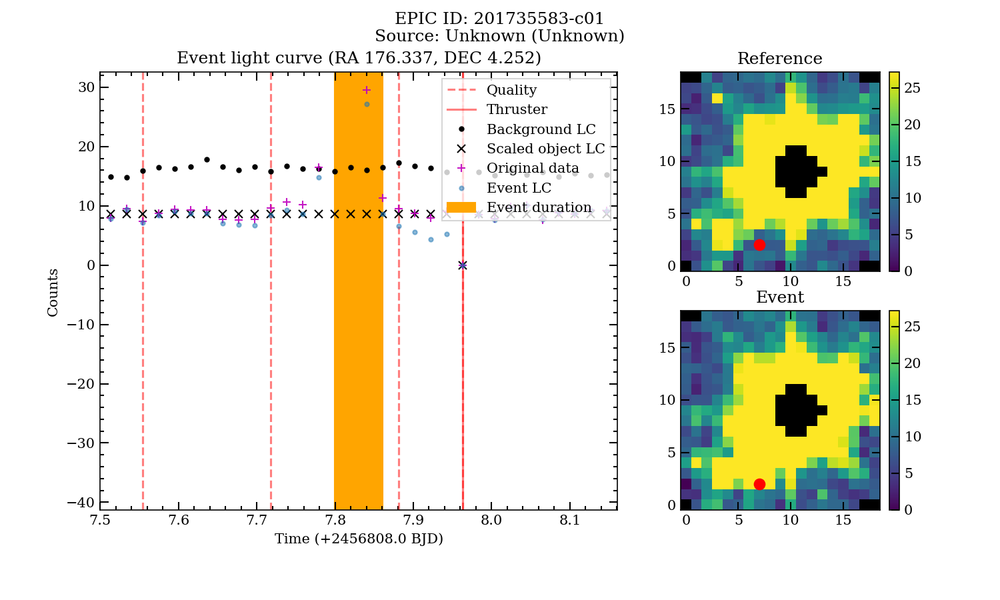

<IPython.core.display.Javascript object>


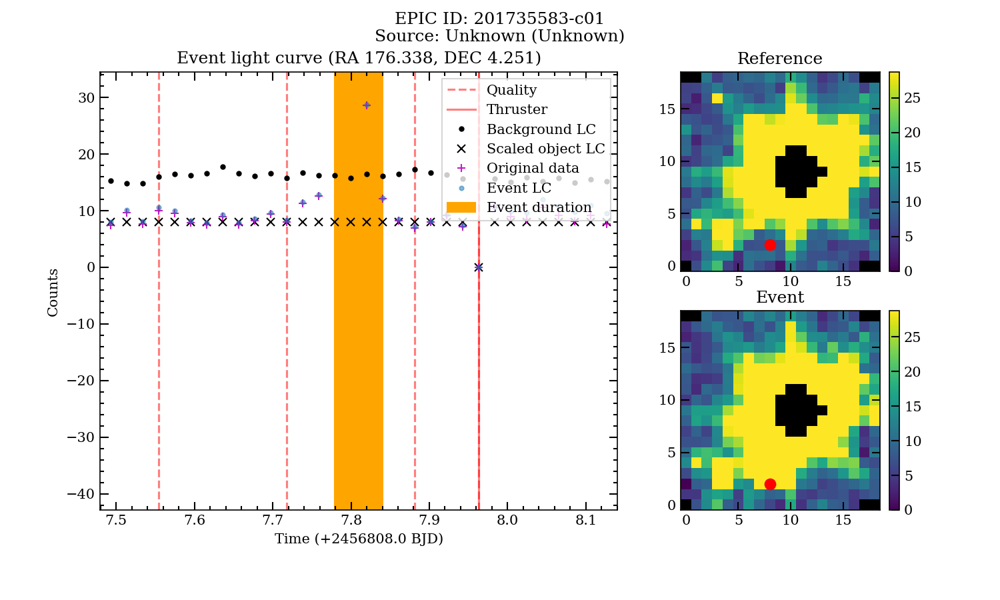

<IPython.core.display.Javascript object>


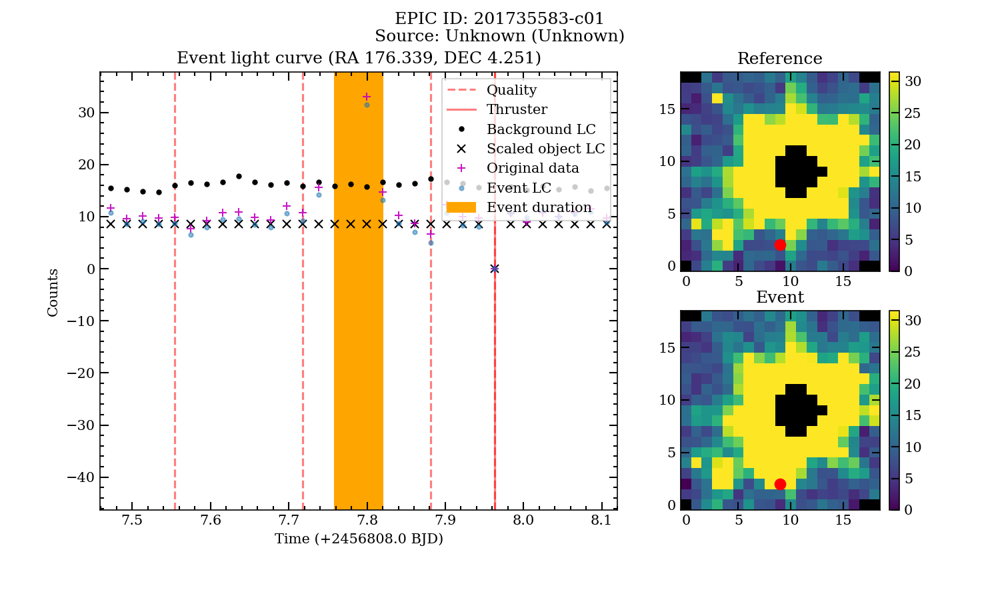

<IPython.core.display.Javascript object>


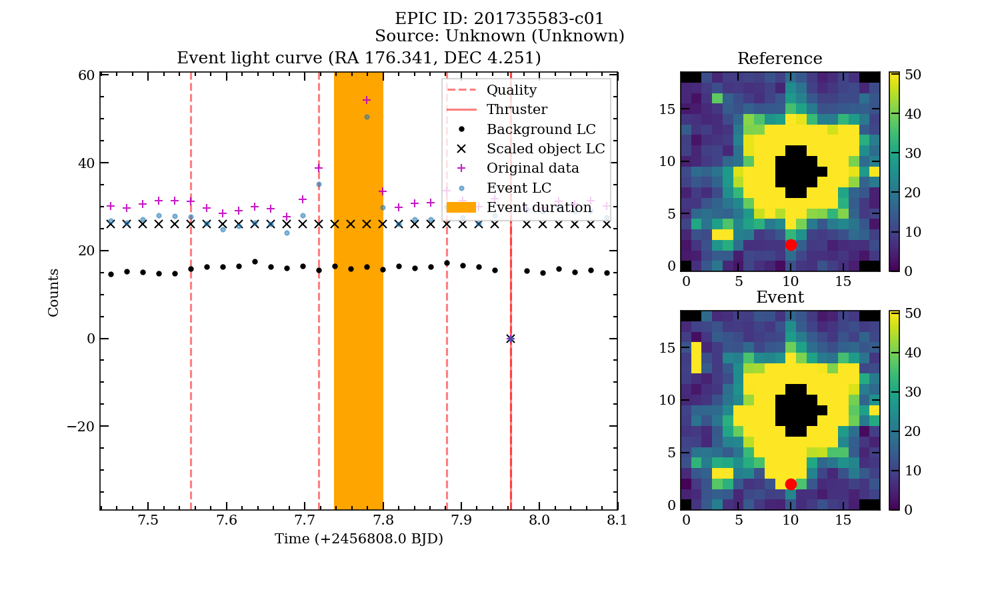

<IPython.core.display.Javascript object>


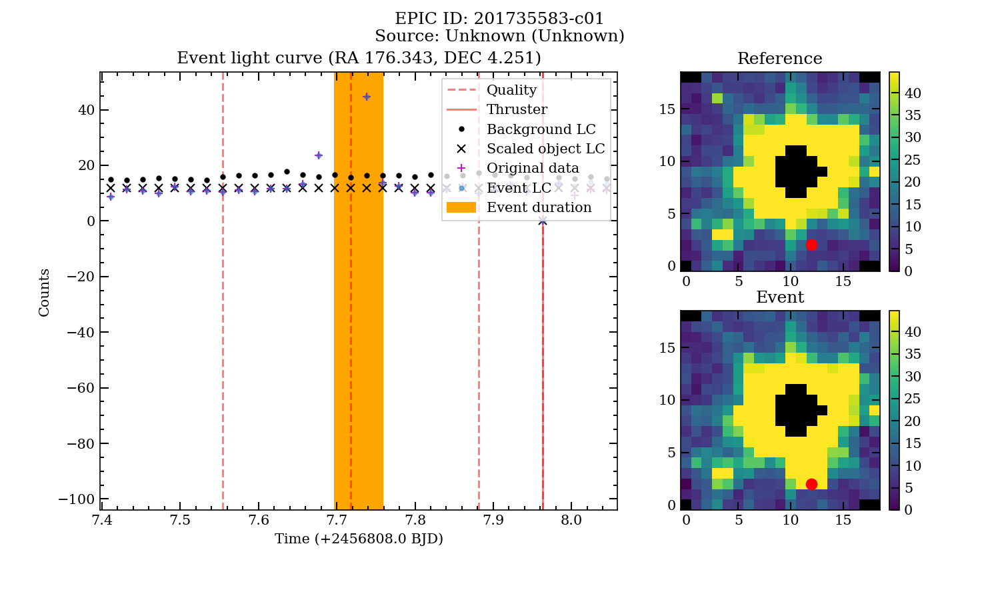

<IPython.core.display.Javascript object>


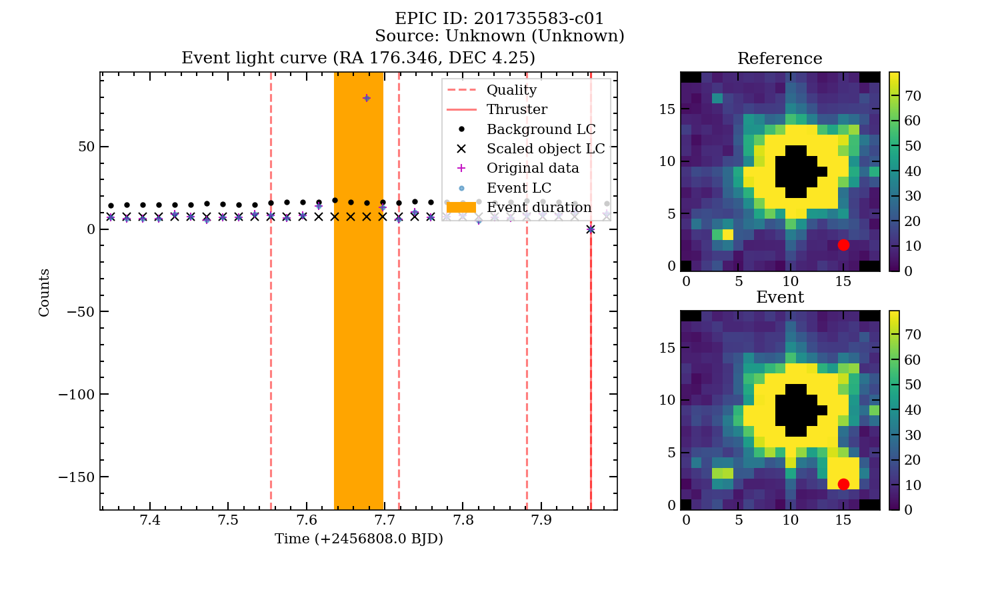

<IPython.core.display.Javascript object>


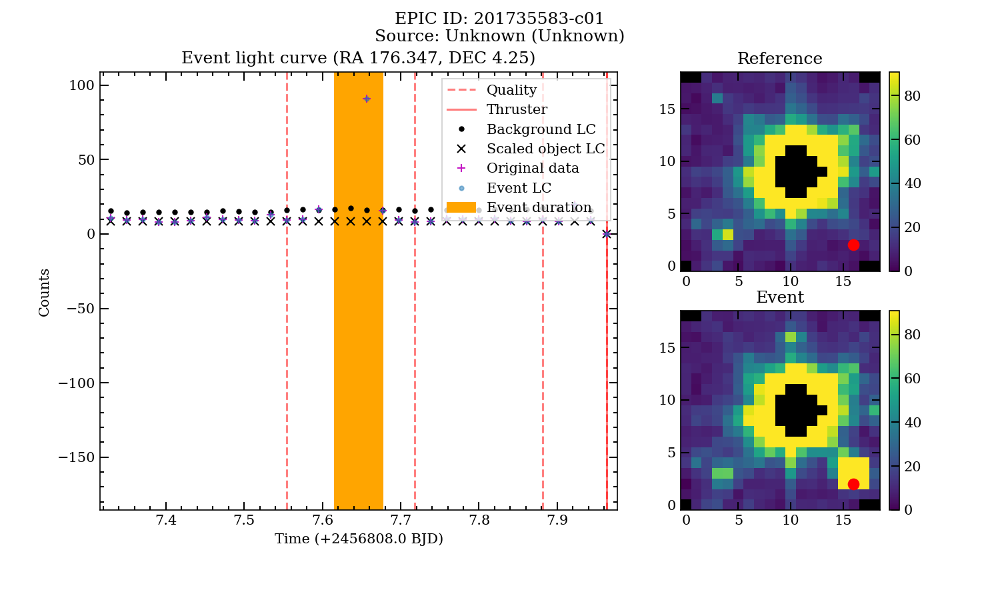

<IPython.core.display.Javascript object>


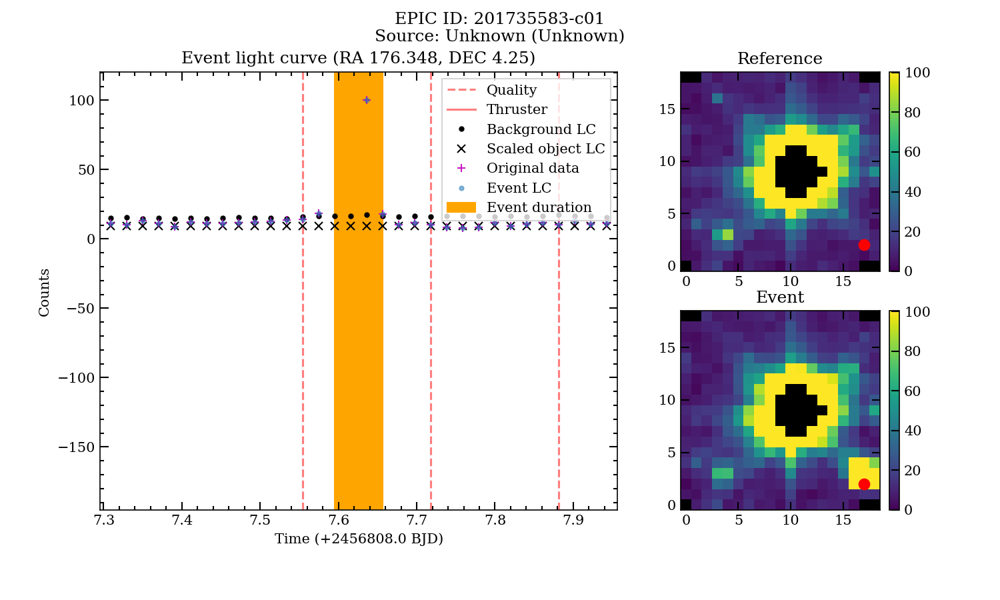

<IPython.core.display.Javascript object>


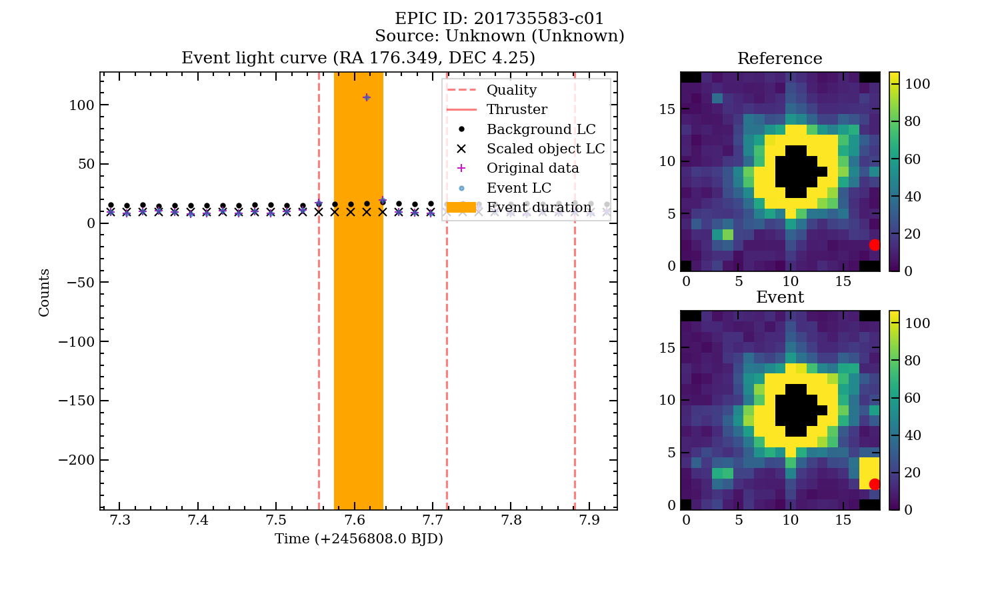

<IPython.core.display.Javascript object>


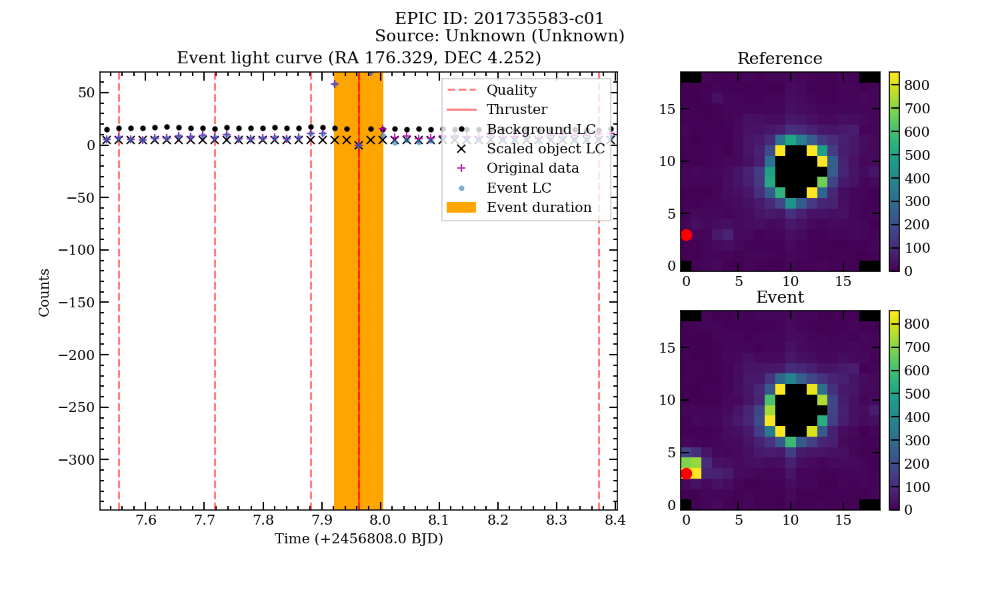

<IPython.core.display.Javascript object>


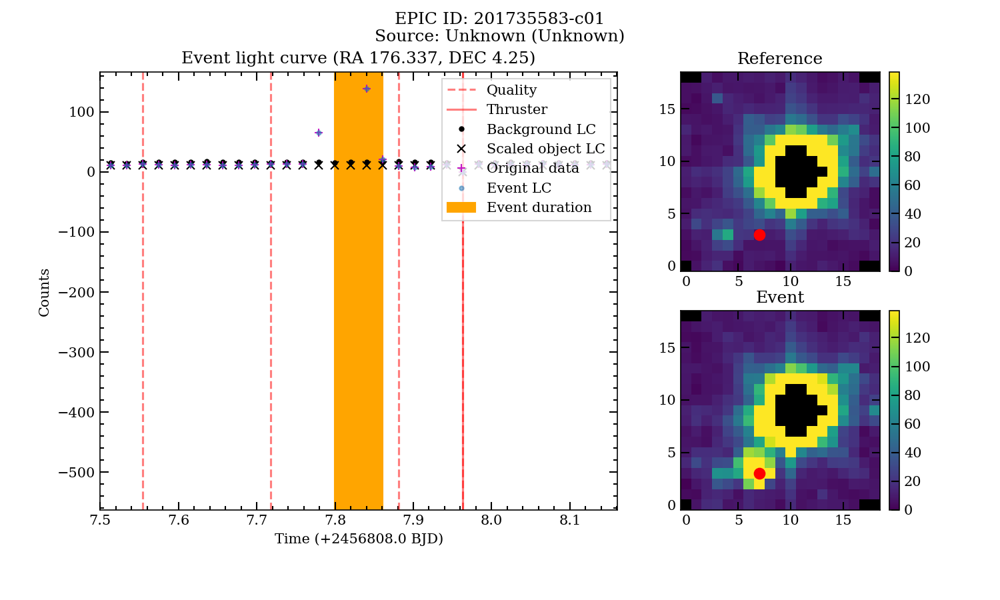

<IPython.core.display.Javascript object>


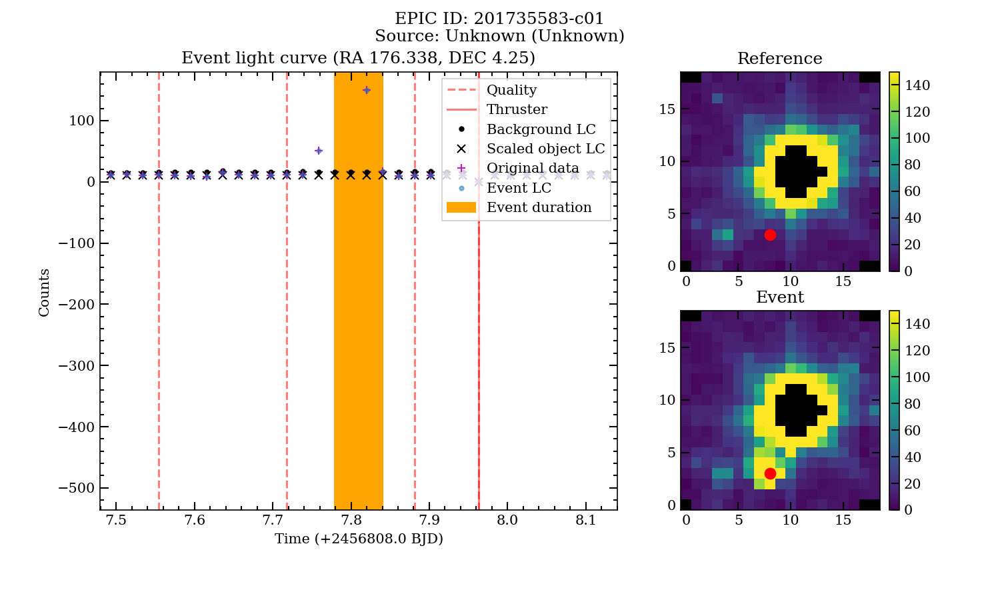

<IPython.core.display.Javascript object>


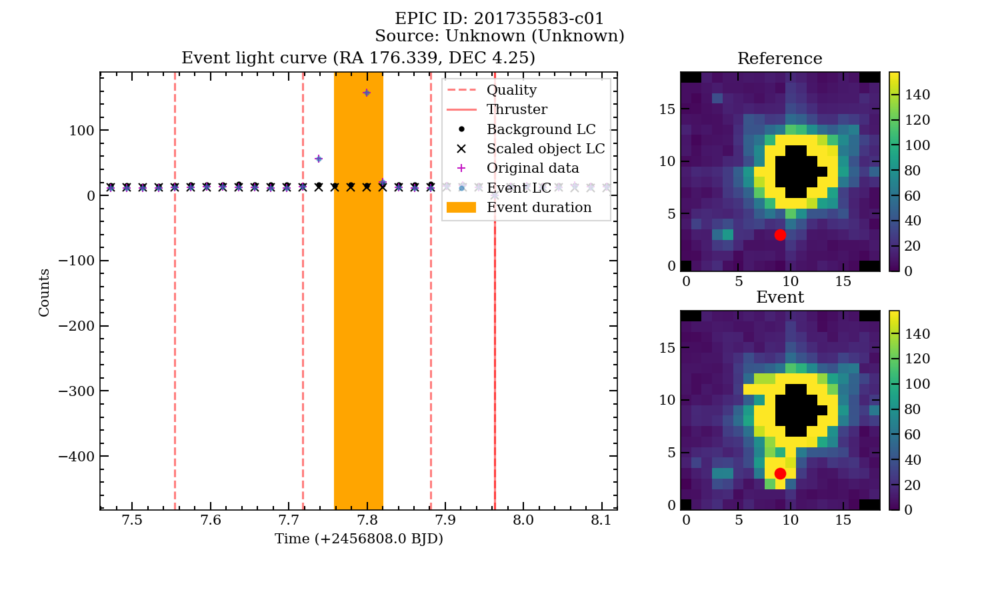

<IPython.core.display.Javascript object>


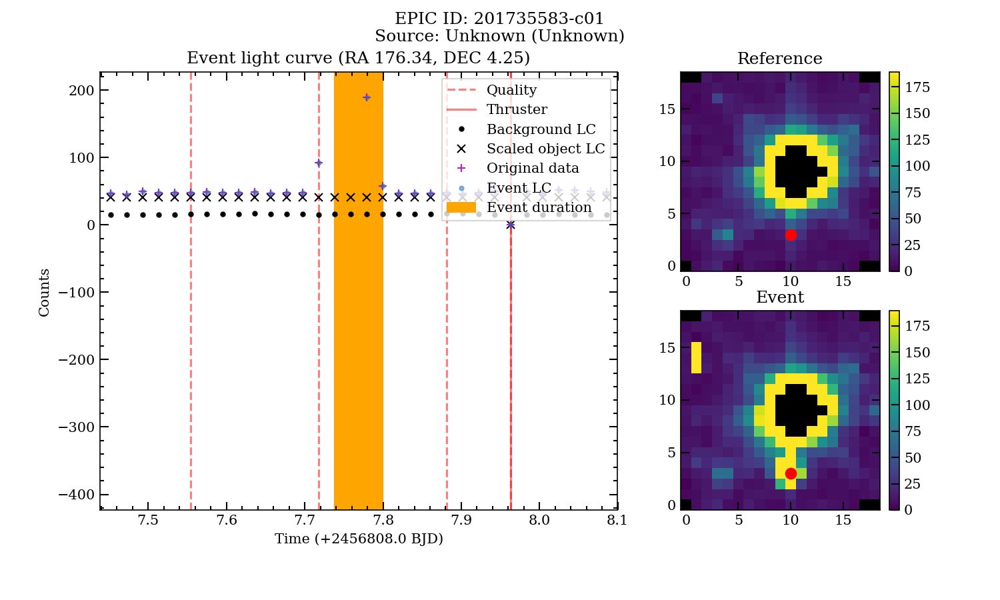

<IPython.core.display.Javascript object>


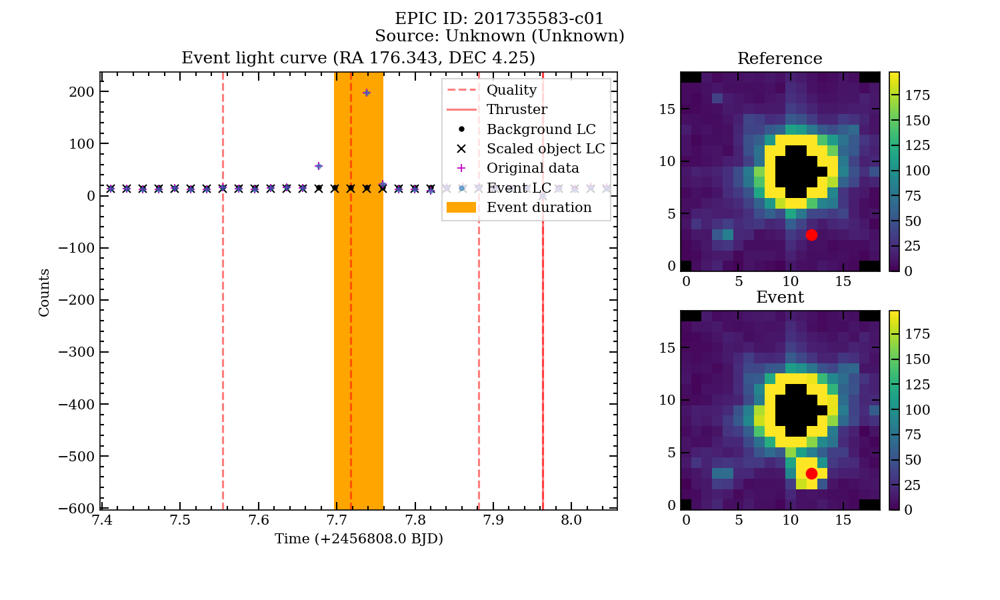

<IPython.core.display.Javascript object>


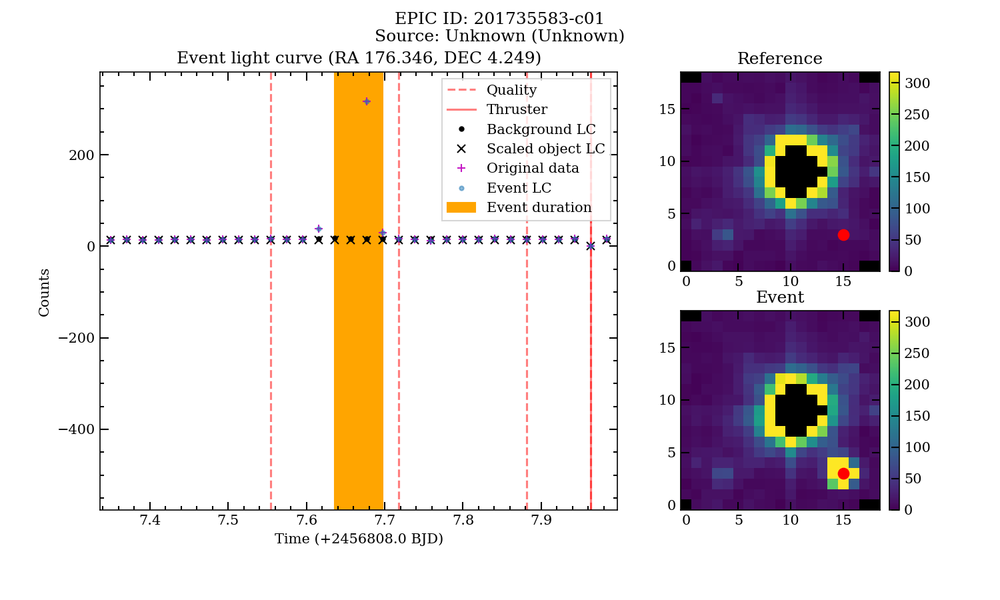

<IPython.core.display.Javascript object>


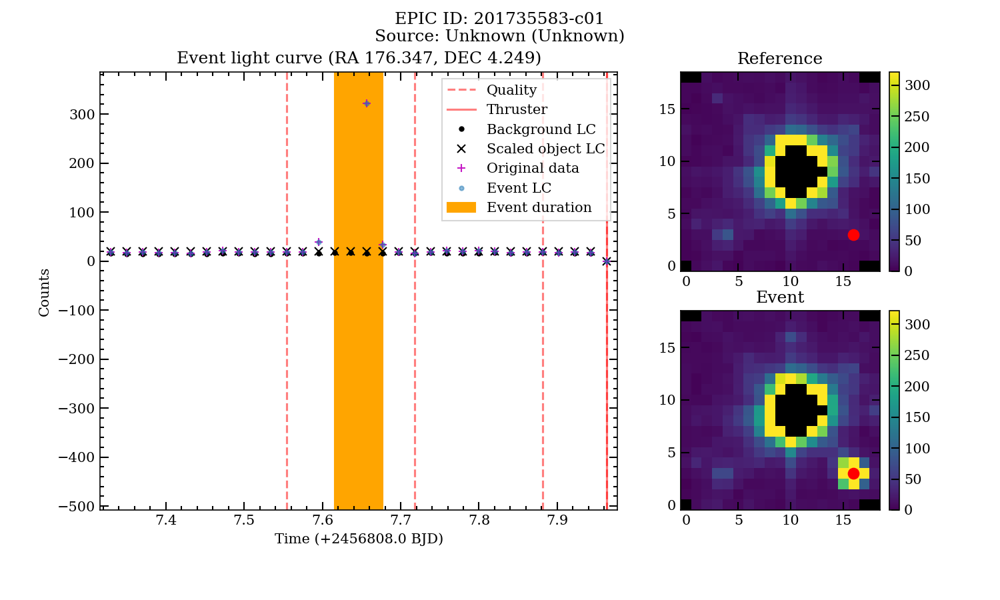

<IPython.core.display.Javascript object>


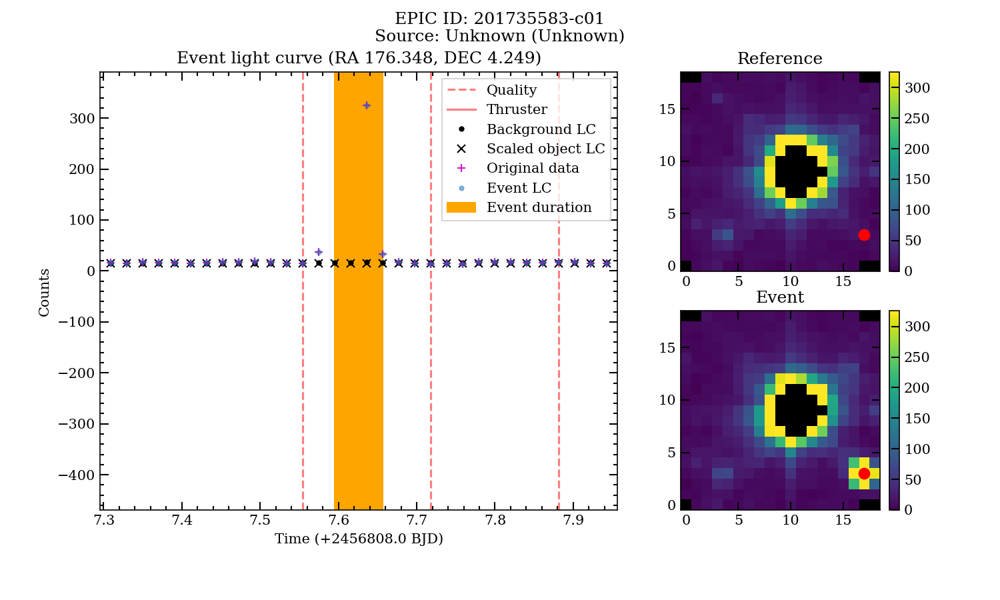

<IPython.core.display.Javascript object>


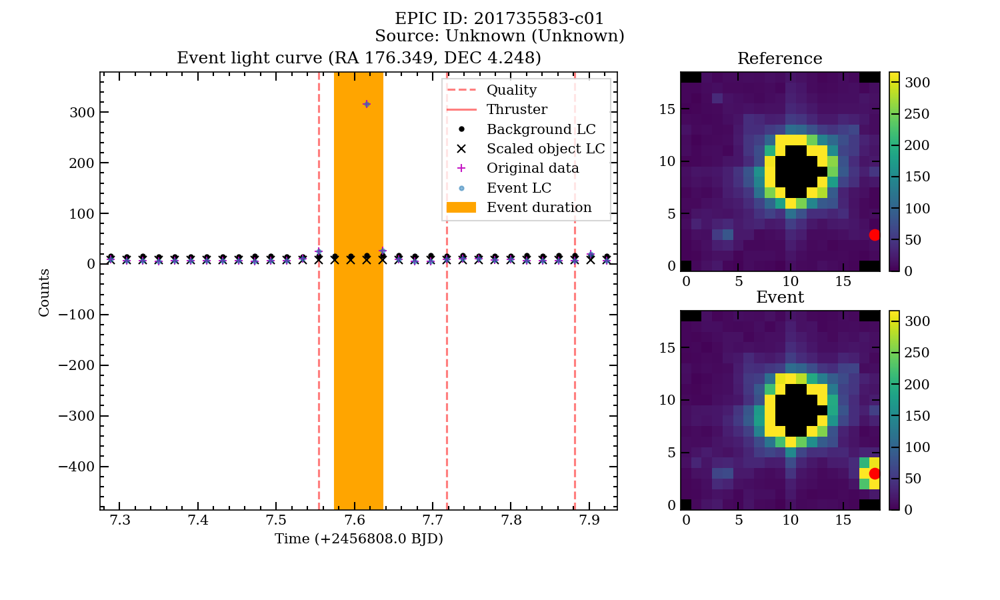

<IPython.core.display.Javascript object>


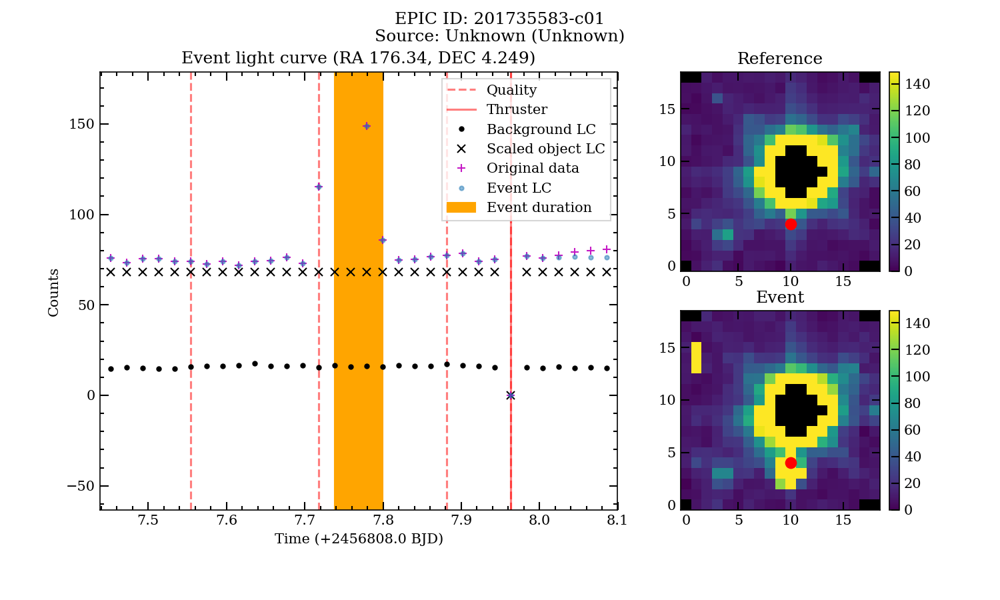

<IPython.core.display.Javascript object>


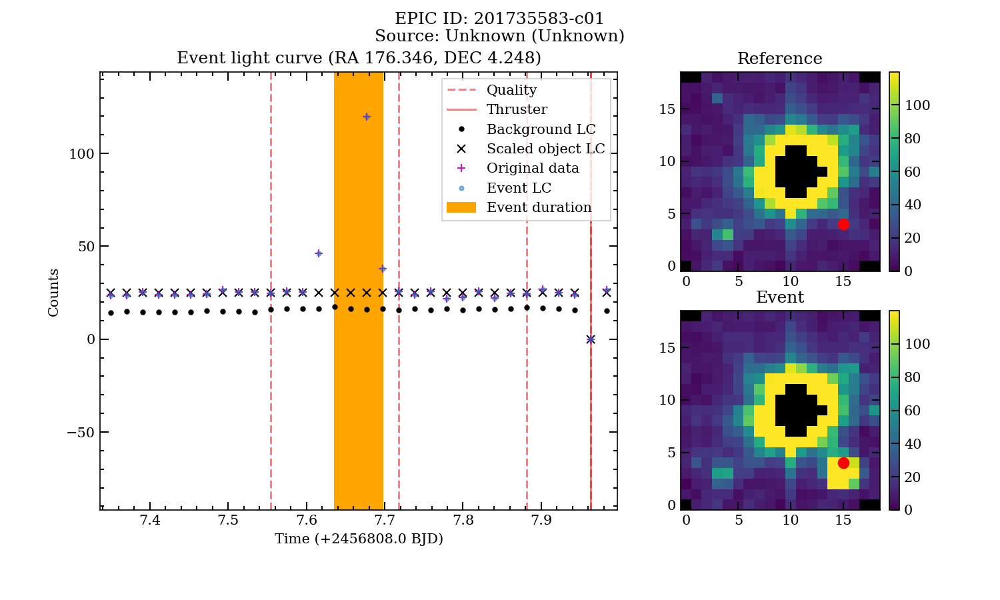

<IPython.core.display.Javascript object>


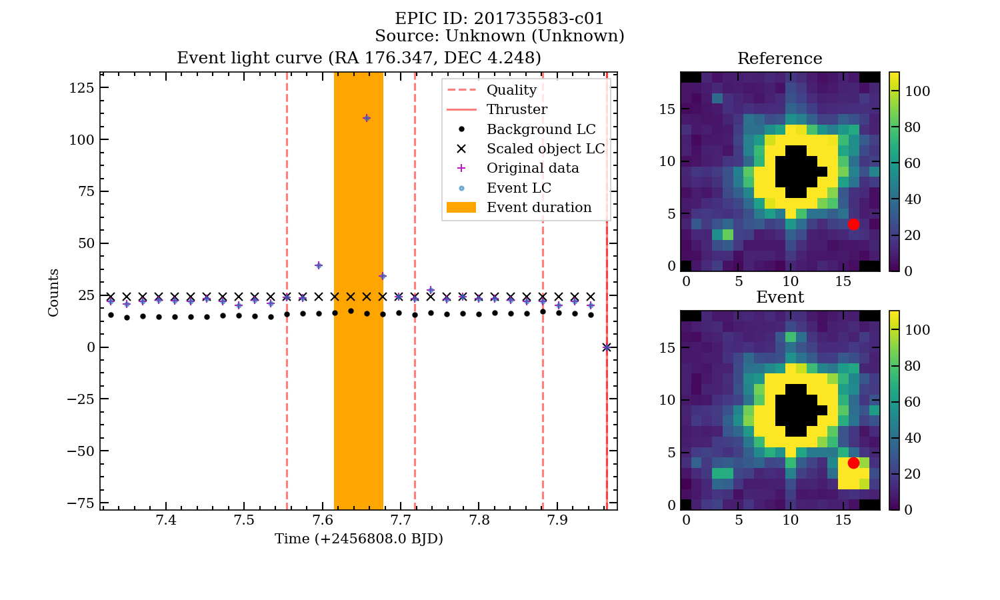

<IPython.core.display.Javascript object>


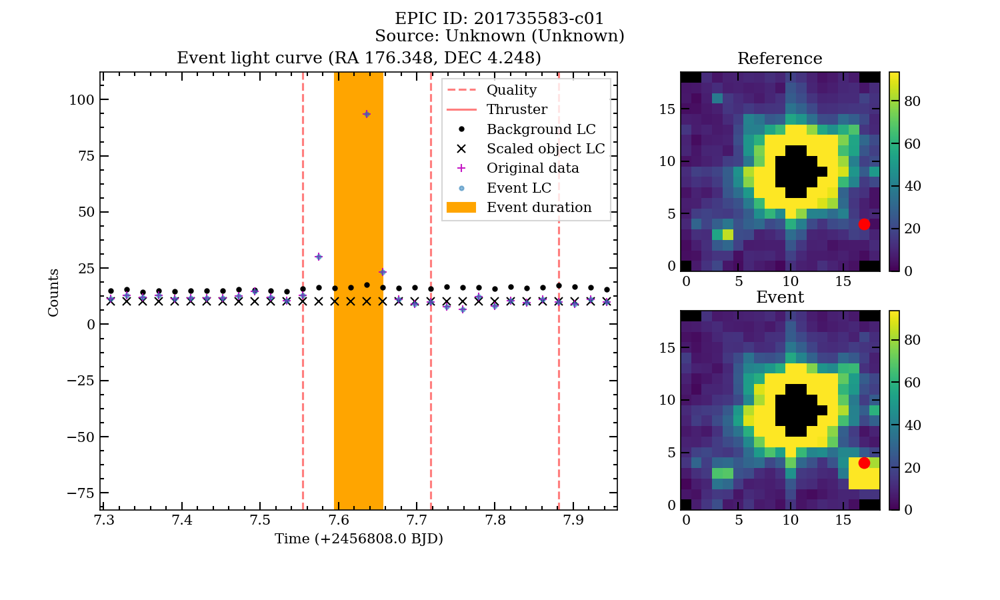

<IPython.core.display.Javascript object>


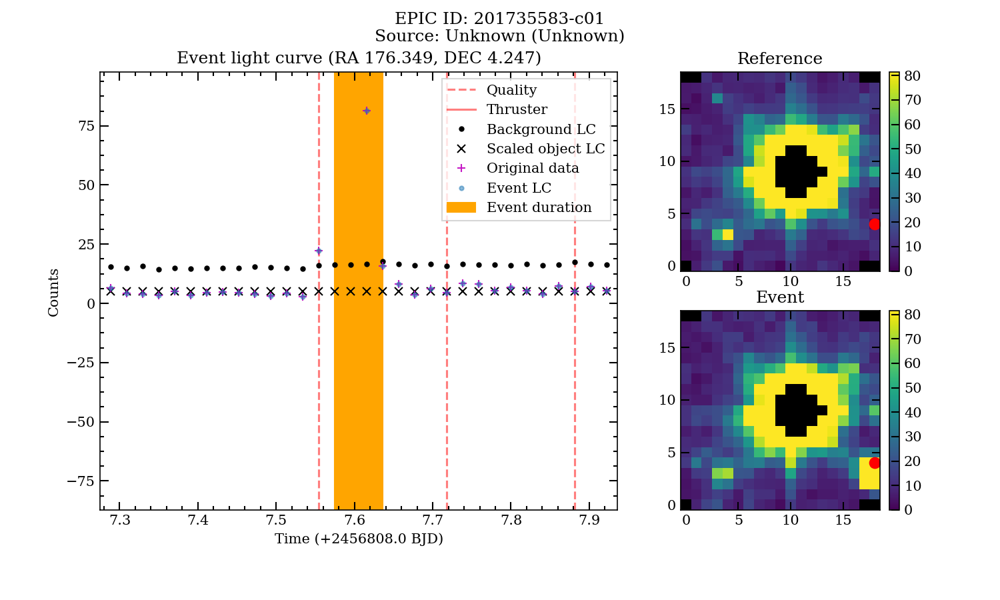

<IPython.core.display.Javascript object>


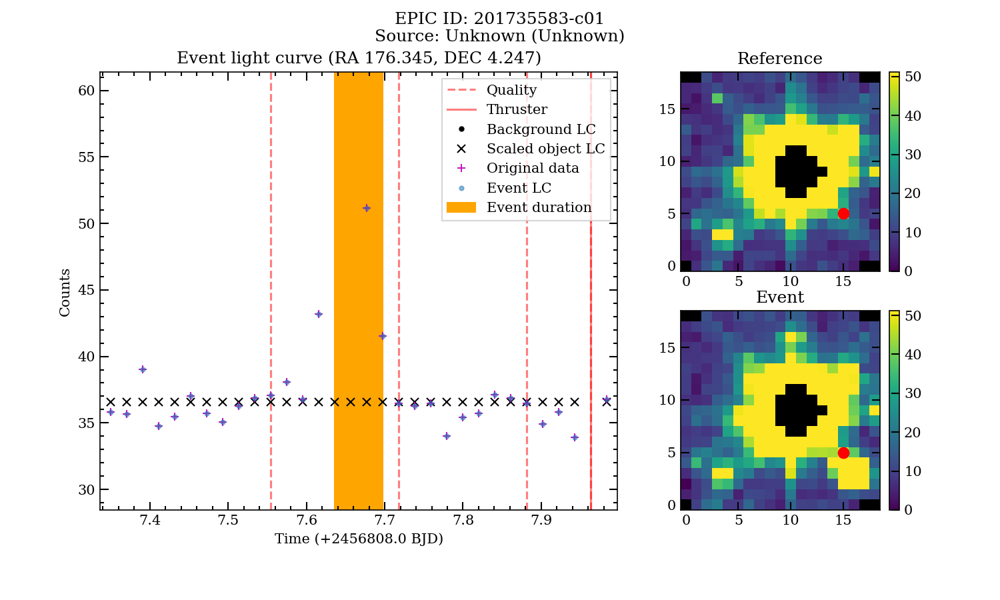

<IPython.core.display.Javascript object>


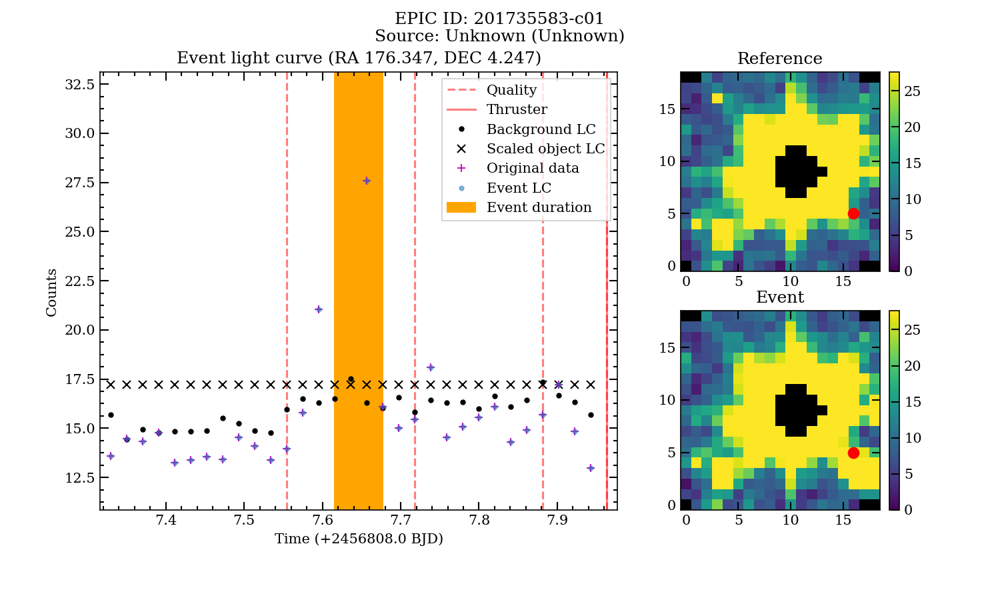

<IPython.core.display.Javascript object>


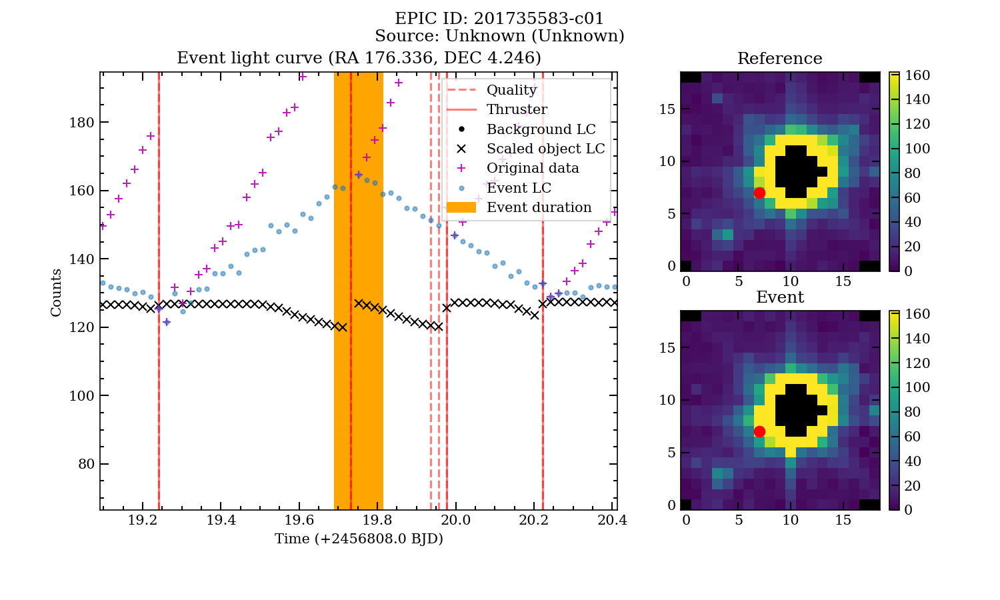

<IPython.core.display.Javascript object>


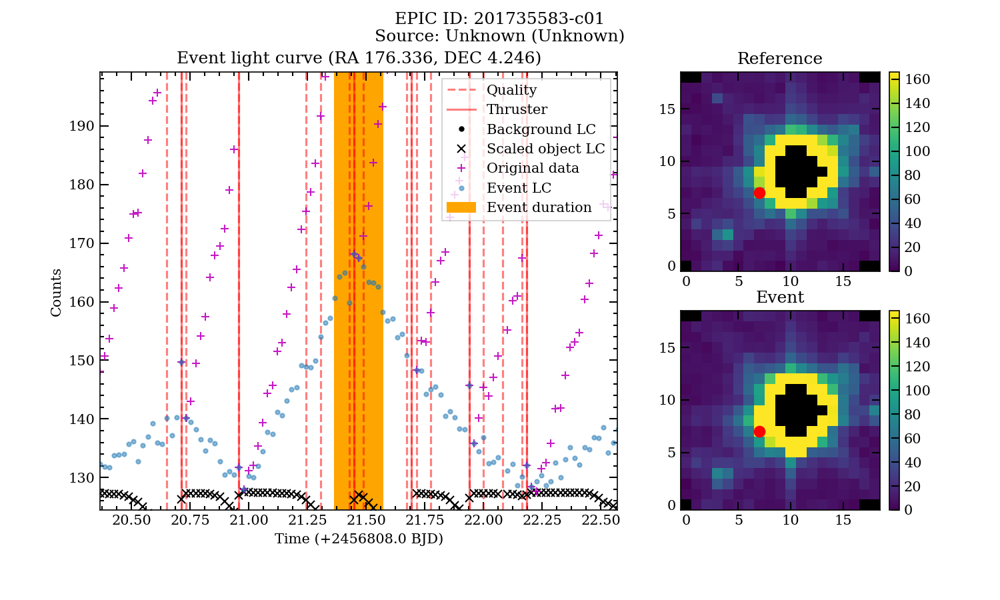

<IPython.core.display.Javascript object>


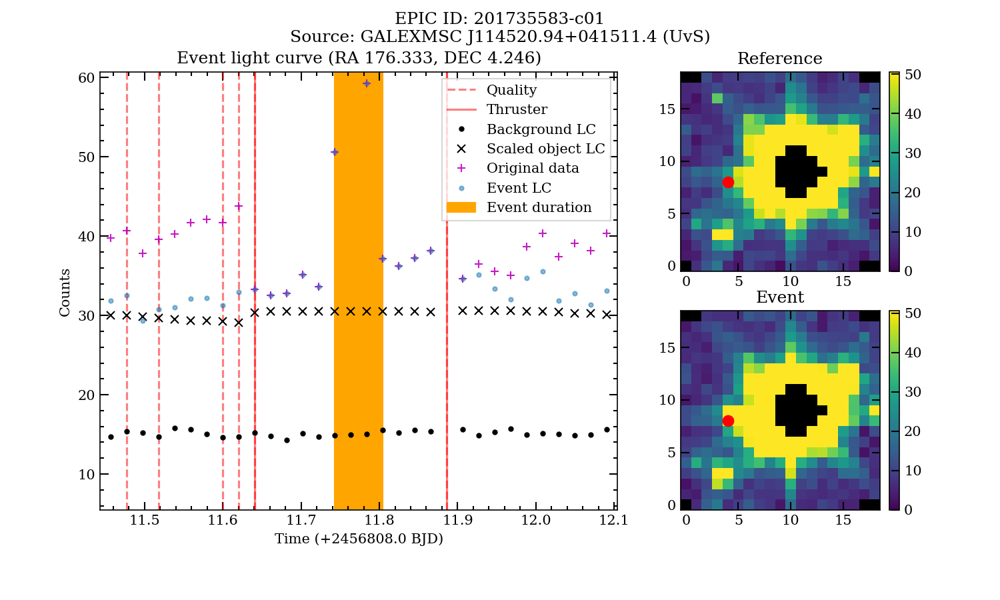

<IPython.core.display.Javascript object>


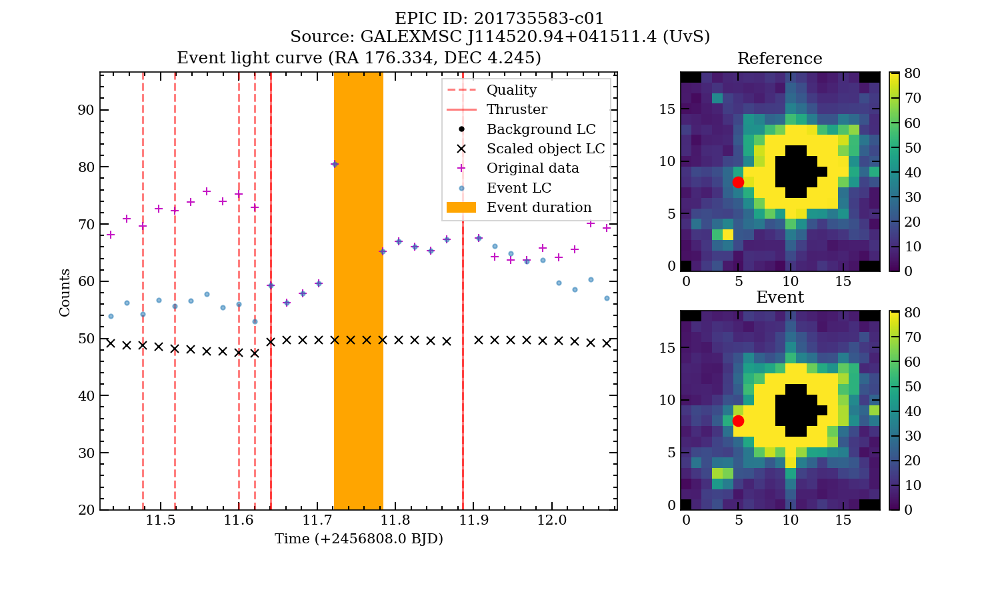

<IPython.core.display.Javascript object>


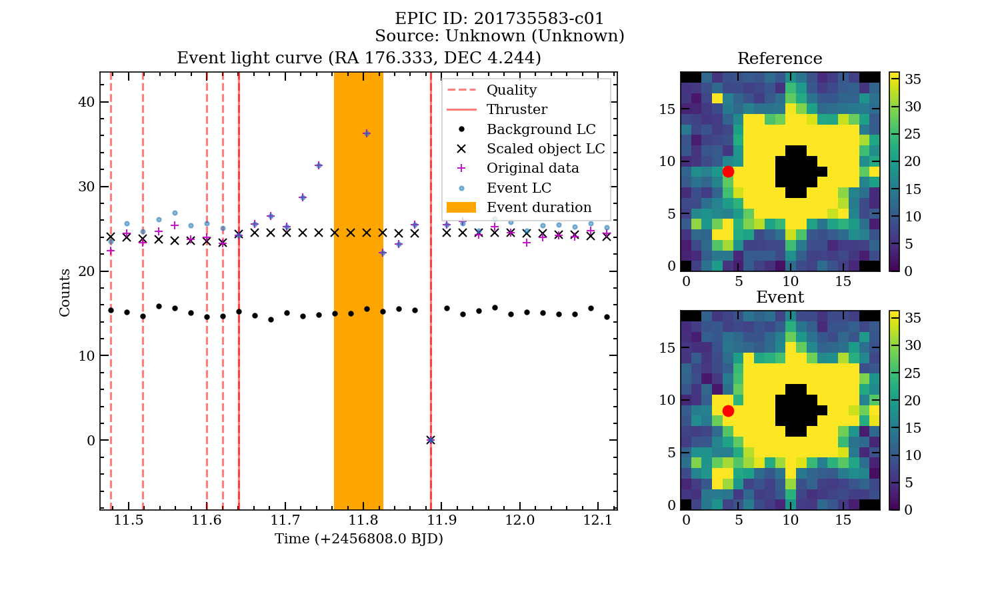

<IPython.core.display.Javascript object>


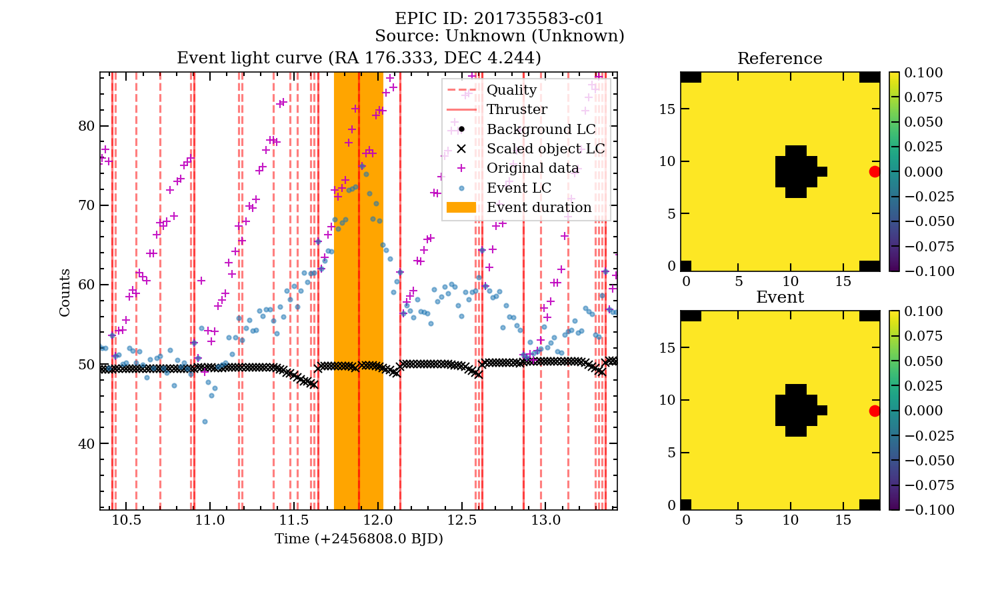

<IPython.core.display.Javascript object>


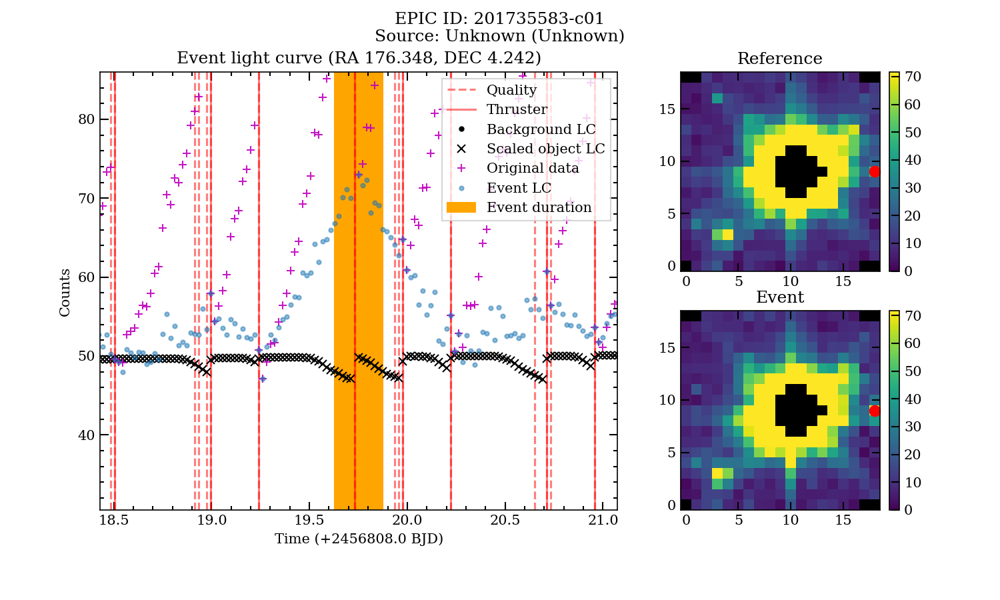

<IPython.core.display.Javascript object>


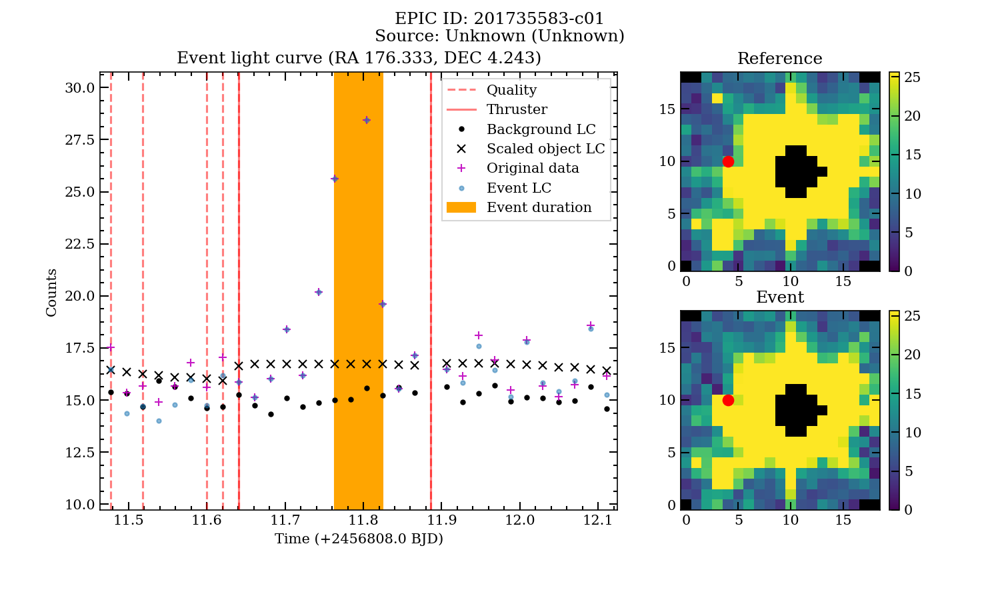

<IPython.core.display.Javascript object>


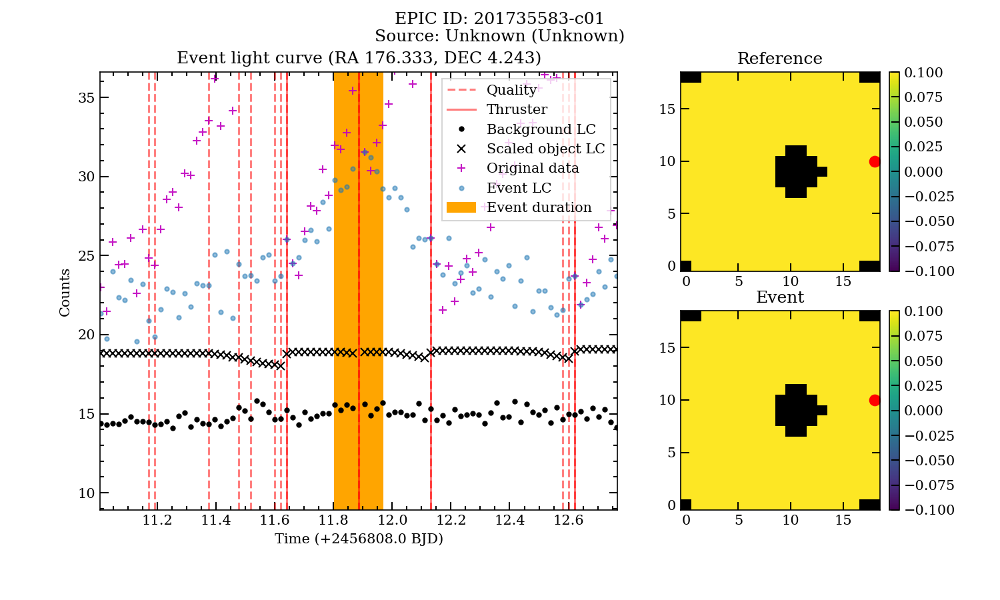

<IPython.core.display.Javascript object>


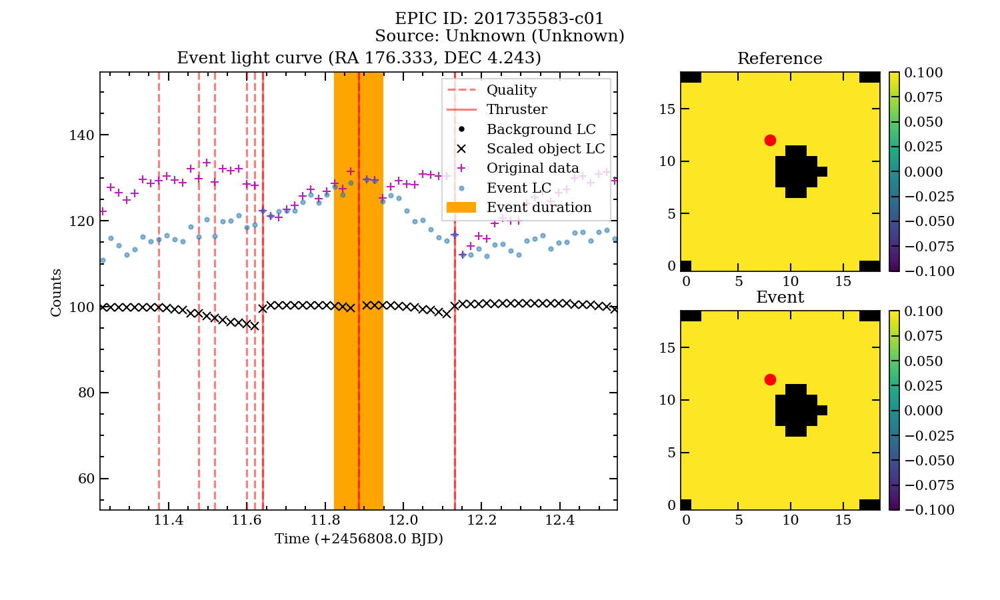

<IPython.core.display.Javascript object>


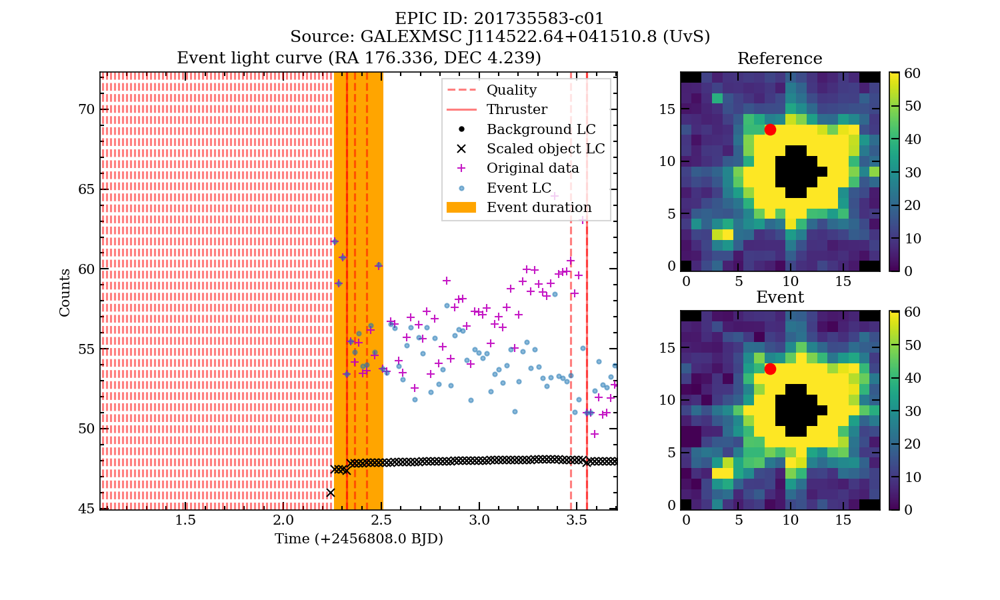

<IPython.core.display.Javascript object>


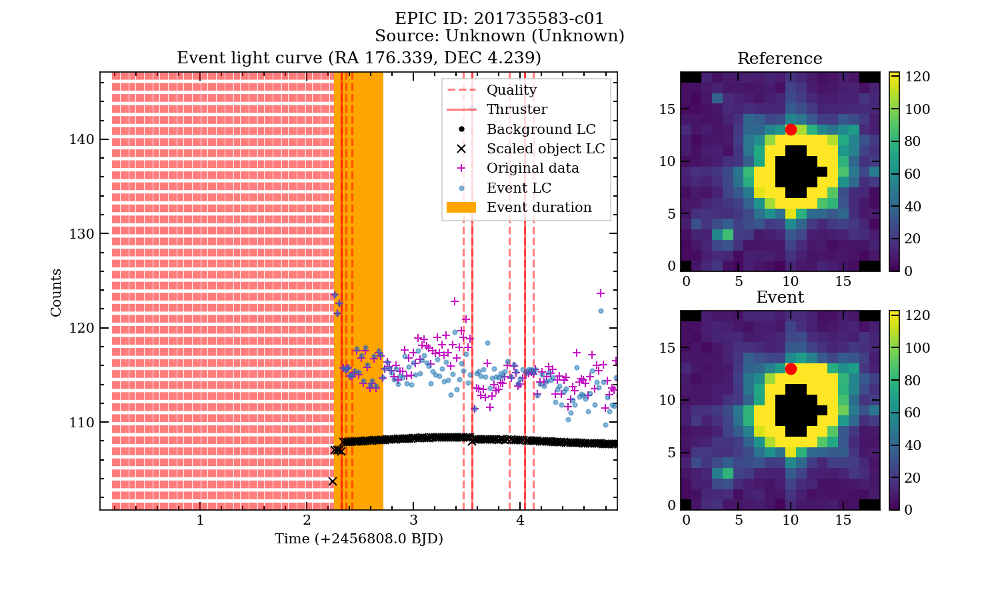

<IPython.core.display.Javascript object>


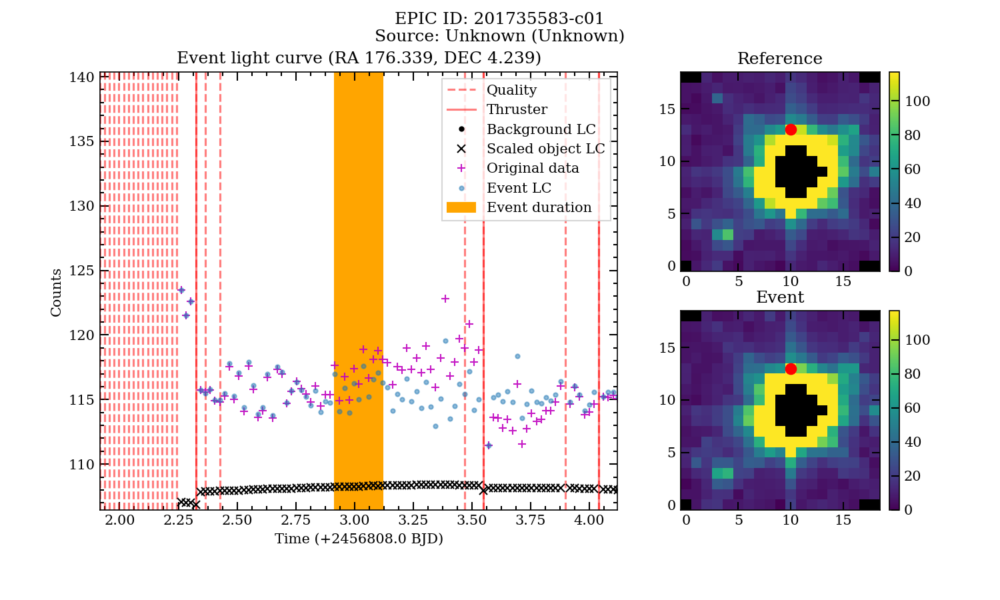

<IPython.core.display.Javascript object>


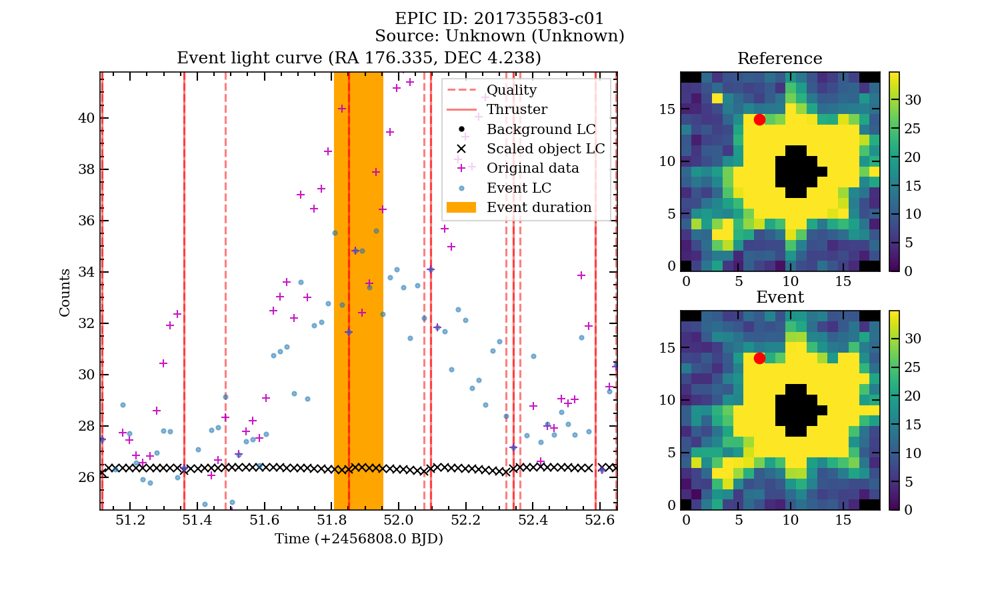

<IPython.core.display.Javascript object>


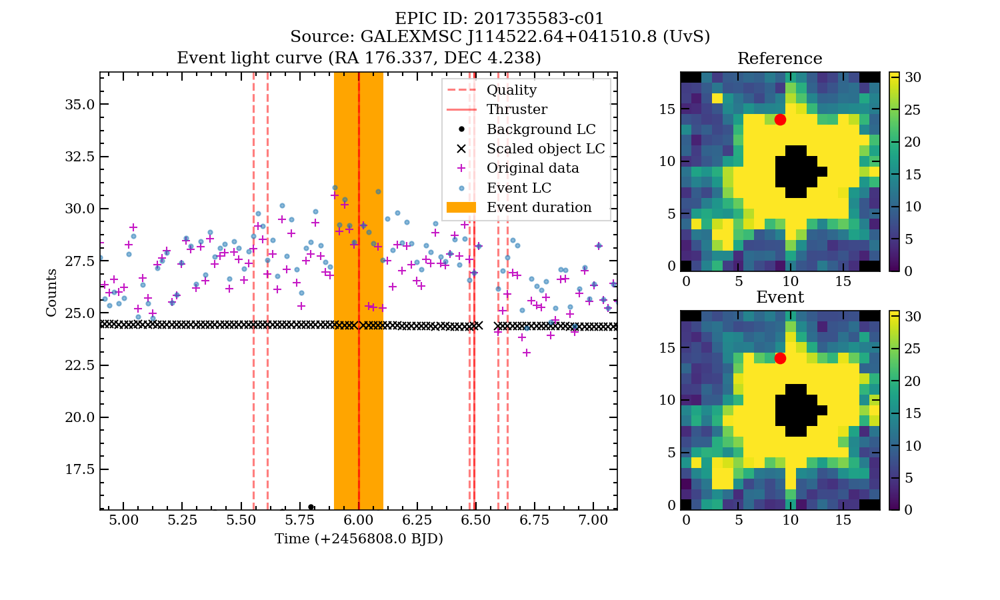

<IPython.core.display.Javascript object>


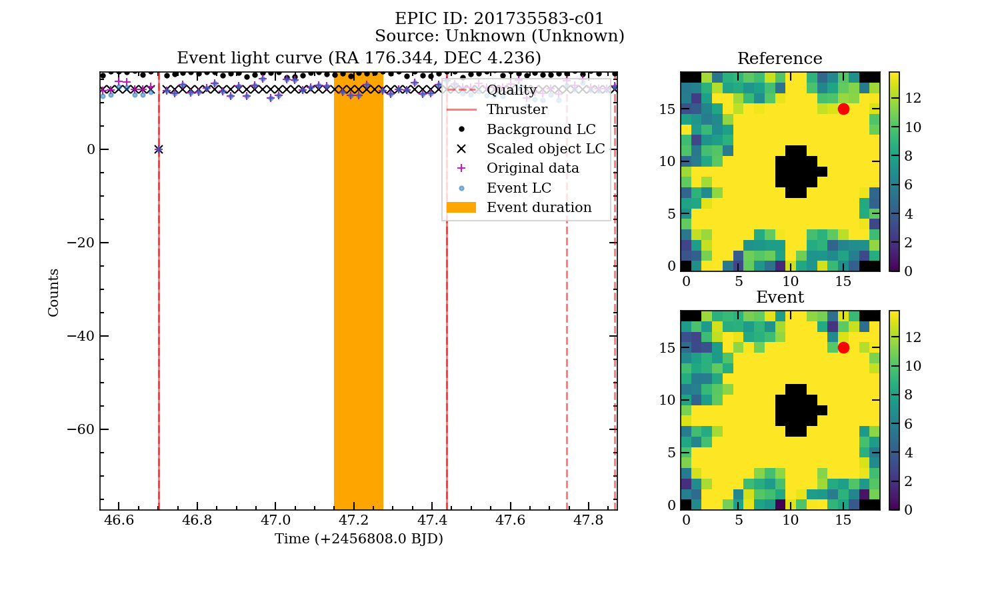

In [3]:
pixelfile = '/Users/ryanr/Documents/PhD/coding/Kepler/Data/ktwo201735583-c01_lpd-targ.fits.gz'#ktwo210780278-c13_lpd-targ.fits.gz'#ktwo201657691-c14_lpd-targ.fits.gz'#ktwo201223037-c01_lpd-targ.fits.gz'#ktwo248517243-c14_lpd-targ.fits.gz'#ktwo251457101-c14_lpd-targ.fits.gz'#ktwo201357268-c01_lpd-targ.fits.gz'#ktwo201834023-c01_lpd-targ.fits.gz'#'/Users/ryanr/Documents/PhD/coding/Kepler/pipelines/goldenrod/data/ktwo212269339-c06_lpd-targ.fits.gz'
save = '/Users/ryanr/Documents/PhD/coding/Kepler/K2'

try:
    hdu = fits.open(pixelfile)
    dat = hdu[1].data
    datacube = fits.ImageHDU(hdu[1].data.field('FLUX')[:]).data#np.copy(testdata)#
    if datacube.shape[1] > 1 and datacube.shape[2] > 1:
        print('in')
        ind = np.where(np.isfinite(datacube[0]))
        for i in range(len(ind)):
            lc = datacube[:,ind[0][i],ind[1][i]]
            datacube[sigma_clip(lc,sigma=5.).mask,ind[0][i],ind[1][i]] = np.nan
        #print(pixelfile)
        time = dat["TIME"] + 2454833.0
        Qual = hdu[1].data.field('QUALITY')
        thrusters = np.where((Qual == 1048576) | (Qual == 1089568) | (Qual == 1056768) | (Qual == 1064960) | (Qual == 1081376) | (Qual == 10240) | (Qual == 32768) | (Qual == 1097760) | (Qual == 1048580) | (Qual == 1081348))[0]
        thrusters = np.insert(thrusters,0,-1)
        thrusters = np.append(thrusters,len(datacube)-2)
        quality = np.where(Qual != 0)[0]
        
        xdrif = dat['pos_corr1']
        ydrif = dat['pos_corr2']
        distdrif = np.sqrt(xdrif**2 + ydrif**2)
        goodthrust = thrusters[np.where(distdrif[thrusters]<0.2)]
        #calculate the reference frame
        if len(goodthrust) > 4:
            Framemin = goodthrust[3]+1
        elif len(goodthrust) > 0:
            Framemin = goodthrust[0]+1
        else:
            Framemin = 100 # Arbitrarily chosen, Data is probably screwed anway if there are no thruster firings.
        # Apply object mask to data
        Mask = ThrustObjectMask(datacube,goodthrust)

        #Maskdata, ast = First_pass(np.copy(datacube),Qual,quality,thrusters,pixelfile)
        Maskdata = datacube*Mask
        Maskdata = Motion_correction(Maskdata,Mask,thrusters,distdrif)*Mask

        # Make a mask for the object to use as a test to eliminate very bad pointings
        obj = np.ma.masked_invalid(Mask).mask
        objmed = np.nanmedian(datacube[thrusters+1]*obj,axis=(0))
        objstd = np.nanstd(datacube[thrusters+1]*obj,axis=(0))

        framemask = np.zeros(Maskdata.shape)

        limit = abs(np.nanmedian(Maskdata[Qual == 0], axis = (0))+3*(np.nanstd(Maskdata[Qual == 0], axis = (0))))
        limit[limit<20] = 20
        framemask = ((Maskdata/limit) >= 1)
        framemask[:,np.where(Maskdata > 100000)[1],np.where(Maskdata > 100000)[2]] = 0

        # Identify if there is a sequence of consecutive or near consecutive frames that meet condtition 

        Eventmask = np.copy(framemask)
        Eventmask[~np.where((convolve(framemask,np.ones((5,1,1)),mode='constant', cval=0.0) >= 4))[0]] = 0
        Eventmask[Qual!=0,:,:] = False


        events, eventtime, eventmask = Event_ID(Eventmask,Mask)

        # Eliminate events that do not meet thruster firing conditions
        events, eventtime, eventmask, asteroid, asttime, astmask = ThrusterElim(events,eventtime,eventmask,thrusters,quality,Qual,Maskdata)
        #print(len(events))
        #events, eventtime, eventmask = Match_events(events,eventtime,eventmask)
        #print(len(events))



        # Create an array that saves the total area of mask and time. 
        # 1st col pixelfile, 2nd duration, 3rd col area, 4th col number of events, 5th 0 if in galaxy, 1 if outside
        # Define the coordinate system 
        funny_keywords = {'1CTYP4': 'CTYPE1',
                          '2CTYP4': 'CTYPE2',
                          '1CRPX4': 'CRPIX1',
                          '2CRPX4': 'CRPIX2',
                          '1CRVL4': 'CRVAL1',
                          '2CRVL4': 'CRVAL2',
                          '1CUNI4': 'CUNIT1',
                          '2CUNI4': 'CUNIT2',
                          '1CDLT4': 'CDELT1',
                          '2CDLT4': 'CDELT2',
                          '11PC4': 'PC1_1',
                          '12PC4': 'PC1_2',
                          '21PC4': 'PC2_1',
                          '22PC4': 'PC2_2'}
        mywcs = {}
        for oldkey, newkey in funny_keywords.items():
            mywcs[newkey] = hdu[1].header[oldkey] 
        mywcs = WCS(mywcs)

        # Save thrusts and quality flags and time 
        Fieldprop = {}
        Fieldprop['File'] = pixelfile
        Fieldprop['Thruster'] = len(thrusters)
        Fieldprop['Quality'] = len(quality)-len(thrusters)
        Fieldprop['Duration'] = len(time)
        Fieldprop['Gal_lat'] = Get_gal_lat(mywcs,datacube)

        # Find all spatially seperate objects in the event mask.
        Objmasks = Identify_masks(obj)
        Objmasks = np.array(Objmasks)
        
        if len(events) > 0:
            Source, SourceType = Database_event_check(Maskdata,eventtime,eventmask,mywcs)
            ObjName, ObjType = Database_check_mask(datacube,thrusters,Objmasks,mywcs)
            Near = Near_which_mask(eventmask,Objmasks,datacube)
            Maskobj = np.zeros((len(events),Maskdata.shape[1],Maskdata.shape[2])) # for plotting masked object reference
            if len(np.where(Objmasks[:,int(Maskdata.shape[1]/2),int(Maskdata.shape[2]/2)] == 1)[0]) > 0:
                CentralMask = np.where(Objmasks[:,int(Maskdata.shape[1]/2),int(Maskdata.shape[2]/2)] == 1)[0]
            elif len(np.where(Objmasks[:,int(Maskdata.shape[1]/2),int(Maskdata.shape[2]/2)] == 1)[0]) > 1:
                CentralMask = np.where(Objmasks[:,int(Maskdata.shape[1]/2),int(Maskdata.shape[2]/2)] == 1)[0][0]
            else:
                CentralMask = -1
            if CentralMask == -1:
                Maskobj[:] = Mask
            else:
                Maskobj[:] = Objmasks[CentralMask]

            for ind in np.where(Near != -1)[0]:
                Source[ind] = 'Near: ' + ObjName[Near[ind]]
                SourceType[ind] = 'Near: ' + ObjType[Near[ind]]
                Maskobj[ind] = Objmasks[Near[ind]]
        SourceType = Isolation(eventtime,eventmask,Maskdata,SourceType)


            # Print figures
        K2TranPixFig(events,eventtime,eventmask,Maskdata,time,Eventmask,mywcs,save,pixelfile,quality,thrusters,Framemin,datacube,Source,SourceType,Maskobj)
            #K2TranPixGif2(events,eventtime,eventmask,Maskdata,mywcs,save,pixelfile,Source,SourceType)


except (OSError):
    pass

In [12]:
events[18]

362

In [13]:
eventmask[18]

[array(3), array(18)]

<IPython.core.display.Javascript object>


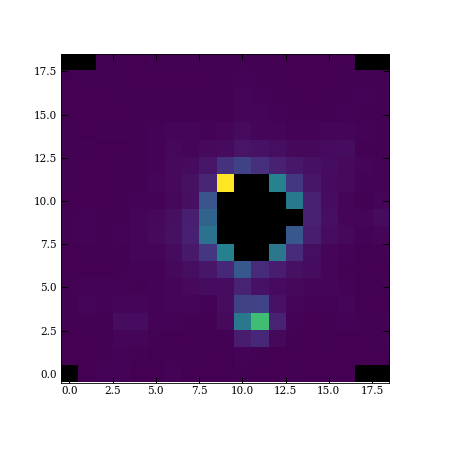

In [9]:
plt.figure()
plt.imshow(Maskdata[370],origin='lower')

In [10]:
print('Bright pixel: ', np.where(np.nanmax(Maskdata[370]) == Maskdata[370])) # This shows us where the brightest pixel in frame 368 is
newframe = Maskdata[370] # This sets a new variable to be the frame 368
newframe[np.where(np.nanmax(Maskdata[370]) == Maskdata[370])] = np.nan # Setting the previous brightest pixel to a NaN value (not a number)
print('Asteroid position: ', (np.where(np.nanmax(newframe) == newframe)))  # This tells us where the next brightest frame is, which in this case is the asteroid's position

# Output 
# Bright pixel:  (array([11]), array([9]))
# Asteroid position:  (array([3]), array([11]))

Bright pixel:  (array([11]), array([9]))
Asteroid position:  (array([3]), array([11]))


## Light curve of pixels around the brightest pixels

<IPython.core.display.Javascript object>


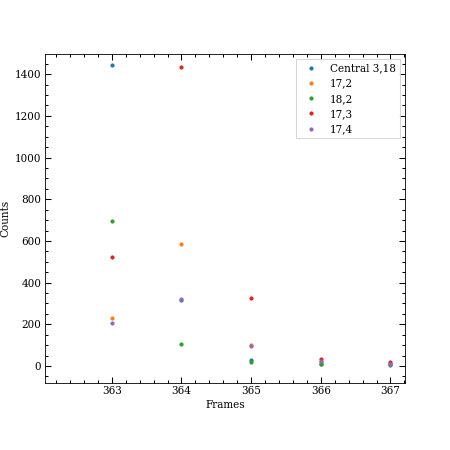

In [14]:
ind = 18
mask = np.zeros((datacube.shape[1],datacube.shape[2]))
mask[eventmask[ind][0],eventmask[ind][1]] = 1
position = np.where(mask)
maxcolor = np.nanmax(Maskdata[eventtime[ind][0]:eventtime[ind][-1]]*(mask==1))
Mid = np.where(Maskdata[eventtime[ind][0]:eventtime[ind][-1]]*(mask==1) == maxcolor)

newmask = np.zeros((Maskdata.shape[1],Maskdata.shape[2]))
newmask[Mid[1],Mid[2]] = 1
surround = convolve(newmask, np.ones((3,3)), mode='constant', cval=0.0) - newmask
pixpos = np.where(surround == 1)
plt.figure()
plt.plot(np.nansum(newmask*Maskdata,axis=(1,2)),'.',label='Central '+ str(Mid[1][0])+','+str(Mid[2][0]))
for i in range(int(np.nansum(surround))-1):
    plt.plot(Maskdata[:,pixpos[0][i],pixpos[1][i]], '.',label=str(pixpos[1][i])+','+str(pixpos[0][i]))
plt.xlim(360, 380)
plt.legend()
plt.minorticks_on()
plt.ylabel('Counts')
plt.xlabel('Frames');
    

## Derivative of the pixels

<IPython.core.display.Javascript object>


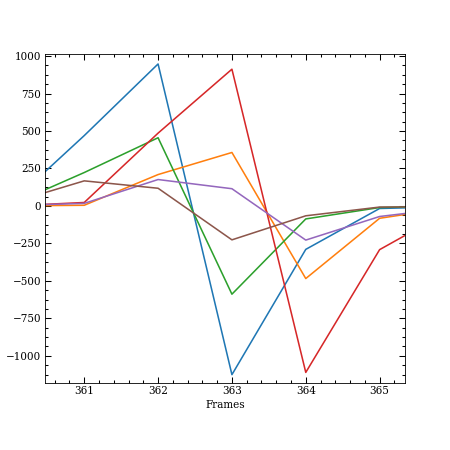

In [17]:
newmask = np.zeros((Maskdata.shape[1],Maskdata.shape[2]))
newmask[Mid[1],Mid[2]] = 1
surround = convolve(newmask, np.ones((3,3)), mode='constant', cval=0.0) - newmask
pixpos = np.where(surround == 1)
plt.figure()
plt.plot(np.diff(np.nansum(newmask*Maskdata,axis=(1,2))),'-',label='Central '+ str(Mid[1][0])+','+str(Mid[2][0]))
for i in range(int(np.nansum(surround))):
    plt.plot(np.diff(Maskdata[:,pixpos[0][i],pixpos[1][i]]), '-',label=str(pixpos[0][i])+','+str(pixpos[1][i]))
plt.xlim(355, 370)
#plt.legend(loc='left')
plt.minorticks_on()
#plt.tight_layout()
plt.ylabel('Derivative of counts')
plt.xlabel('Frames');

See what the diference of the derivatives looks like.

<IPython.core.display.Javascript object>


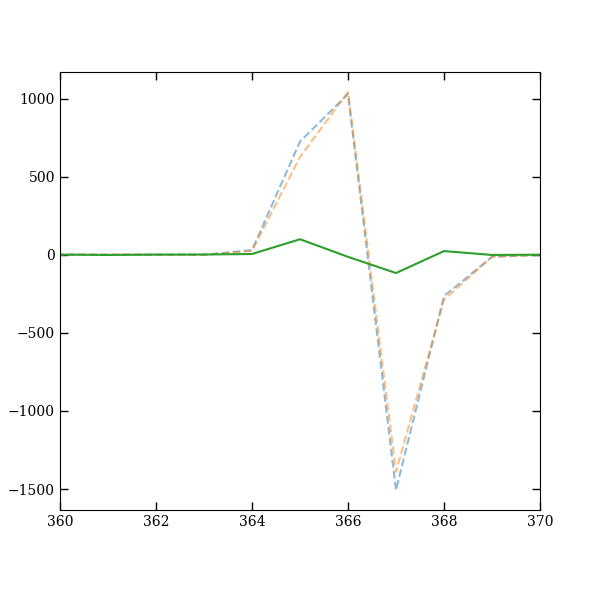

(360, 370)

In [11]:
plt.figure()
plt.plot(np.diff(np.nansum(newmask*Maskdata,axis=(1,2))),'--',alpha = 0.5)
plt.plot(np.roll(np.diff(Maskdata[:,3,15]),1),'--',alpha = 0.5)
plt.plot(np.diff(np.nansum(newmask*Maskdata,axis=(1,2))) - np.roll(np.diff(Maskdata[:,3,15]),1))

plt.xlim(360, 370)

<IPython.core.display.Javascript object>


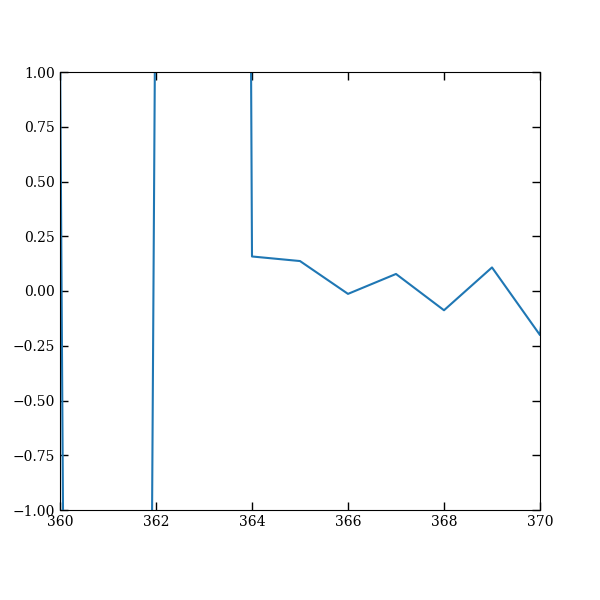

(360, 370)

In [17]:
plt.figure()
plt.plot((np.diff(np.nansum(newmask*Maskdata,axis=(1,2))) - np.roll(np.diff(Maskdata[:,3,15]),1))/np.diff(np.nansum(newmask*Maskdata,axis=(1,2))))
plt.ylim(-1,1)
plt.xlim(360, 370)

## A go at a moving mask based on max brightness

In [4]:
def Ast_weighted_pos(Data, Time, Mask, Mid):
    total = np.nansum(Data[Time,Mask==1])
    perc = Maskdata[Time,Mask==1]/total
    unit = np.where(Mask == 1)
    unit = np.array(unit)
    unit[0] = unit[0] - Mid[0]
    unit[1] = unit[1] - Mid[1]
    xdisp = 0
    ydisp = 0
    for i in range(len(unit[0])):
        xdisp += unit[0][i]*perc[i]
        ydisp += unit[1][i]*perc[i]
    astpos = [Mid[0][0]+xdisp,Mid[1][0]+ydisp]
    return astpos

In [14]:
ind = 18
mask = np.zeros((datacube.shape[1],datacube.shape[2]))
mask[eventmask[ind][0],eventmask[ind][1]] = 1

position = np.where(mask)
maxcolor = np.nanmax(Maskdata[eventtime[ind][0]:eventtime[ind][-1]]*(mask==1))
Mid = np.where(Maskdata[eventtime[ind][0]:eventtime[ind][-1]]*(mask==1) == maxcolor)

bright = np.zeros((Maskdata.shape[1],Maskdata.shape[2]))
bright[Mid[1],Mid[2]] = 1
surround = convolve(bright, np.ones((3,3)), mode='constant', cval=0.0) - bright
#pixpos = np.where(surround == 1)

start = int(eventtime[ind][0]+Mid[0])

masktime = []
astmask = []
astpos = []
astvel = []
for i in range(len(time[start:])):
    if i == 0:
        masktime.append(start)
        astmask.append(bright+surround)
        astpos.append(Ast_weighted_pos(datacube,start+i,(bright+surround),Mid))
    else:
        #oldbright = np.where(bright == 1)
        
        maxcount = np.nanmax(datacube[start+i]*((bright + surround)==1))

        #print(maxcount)
        if ~np.isnan(maxcount):
            if (maxcount/maxcolor < 0.1):
                print('break')
                break
            mid = np.where(datacube[start+i]*((bright + surround)==1) == maxcount)
            #print(mid)

            bright = np.zeros((Maskdata.shape[1],Maskdata.shape[2]))
            bright[mid[0],mid[1]] = 1
            surround = convolve(bright, np.ones((3,3)), mode='constant', cval=0.0) - bright

            masktime.append(int(start)+i)
            astmask.append(bright+surround)
            astpos.append(Ast_weighted_pos(datacube,start+i,(bright+surround),mid))
            astvel.append([astpos[i][0]-astpos[i-1][0],astpos[i][1]-astpos[i-1][1]]) # pixels per frame
            predicted = [int(round(mid[0][0]+astvel[i-1][0])),int(round(mid[1][0]+astvel[i-1][1]))]
            
            
        else:
            print('prediction')
            if (maxcount/maxcolor < 0.1):
                print('break')
                break
            mid = (np.array([predicted[0]]),np.array([predicted[1]]))
            bright = np.zeros((Maskdata.shape[1],Maskdata.shape[2]))
            bright[mid[0],mid[1]] = 1
            surround = convolve(bright, np.ones((3,3)), mode='constant', cval=0.0) - bright

            masktime.append(int(start)+i)
            astmask.append(bright+surround)
            astpos.append(predicted)
            astvel.append(astvel[i-2])
            
            predicted = [int(round(mid[0][0]+astvel[i-1][0])),int(round(mid[1][0]+astvel[i-1][1]))]

            
        print(astvel[i-1])
        if (predicted[0] < 0) & (predicted[0] > datacube.shape[0]) & (predicted[1] < 0) & (predicted[1] > datacube.shape[1]):
            print('break')
            break
            
masktime=np.array(masktime)
astpos = np.array(astpos)

[0.047634025201857, -0.8497950067423083]
[0.03538161666798256, -1.0249428817577257]
[0.037811986452660484, -1.0226634726488548]
[0.030654041887666406, -1.0198859818493098]
[0.031294355434184684, -1.0292803561215091]
[0.02674679528372037, -1.0142005296987993]
[0.035413194562333494, -1.0353431663836172]
[0.028628864567005863, -0.9985295718754905]
[0.02699202966813985, -1.0021740146258118]
[0.020849613486131346, -1.0504762784595192]
[0.02456892622724638, -1.0154851816701767]
[0.01612360113922895, -1.0180459543866913]
[0.02825548188071858, -1.009872582166877]
[0.01357700032081599, -0.9988146311853399]
[0.03020871622108201, -0.9686891794584334]
[0.03853081804467173, -1.010103917772088]
[0.058242702154712056, -1.041317500016263]
prediction
[0.058242702154712056, -1.041317500016263]
break


In [15]:
astmask

[array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 1., 1.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 1., 1.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 1., 1.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0

In [37]:
Maskdata[eventtime[ind][0]:eventtime[ind][-1]]*(mask==1) == maxcolor

array([[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ..., 
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ..., 
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],

       [[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ..., 
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, 

## Animate the moving mask

In [7]:
import matplotlib.animation as animation
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
%matplotlib notebook

<IPython.core.display.Javascript object>


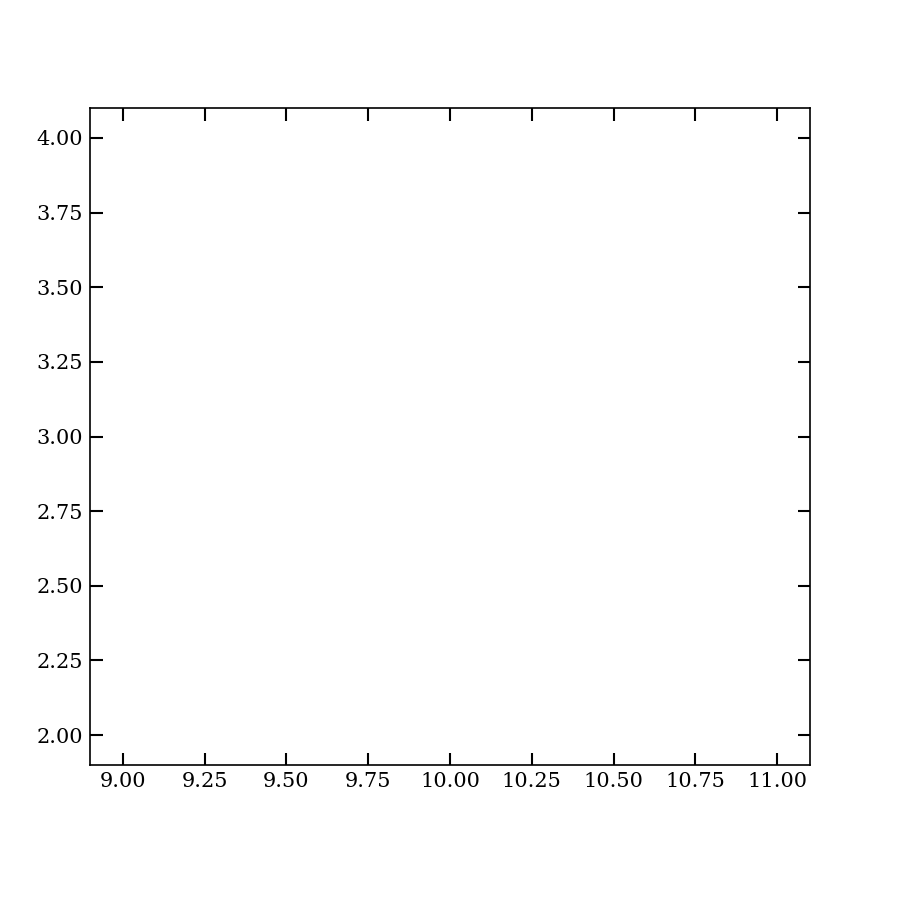

In [8]:
dots = plt.plot(np.where(astmask[0] == 1)[1],np.where(astmask[0] == 1)[0],'r.',animated=True)

<IPython.core.display.Javascript object>


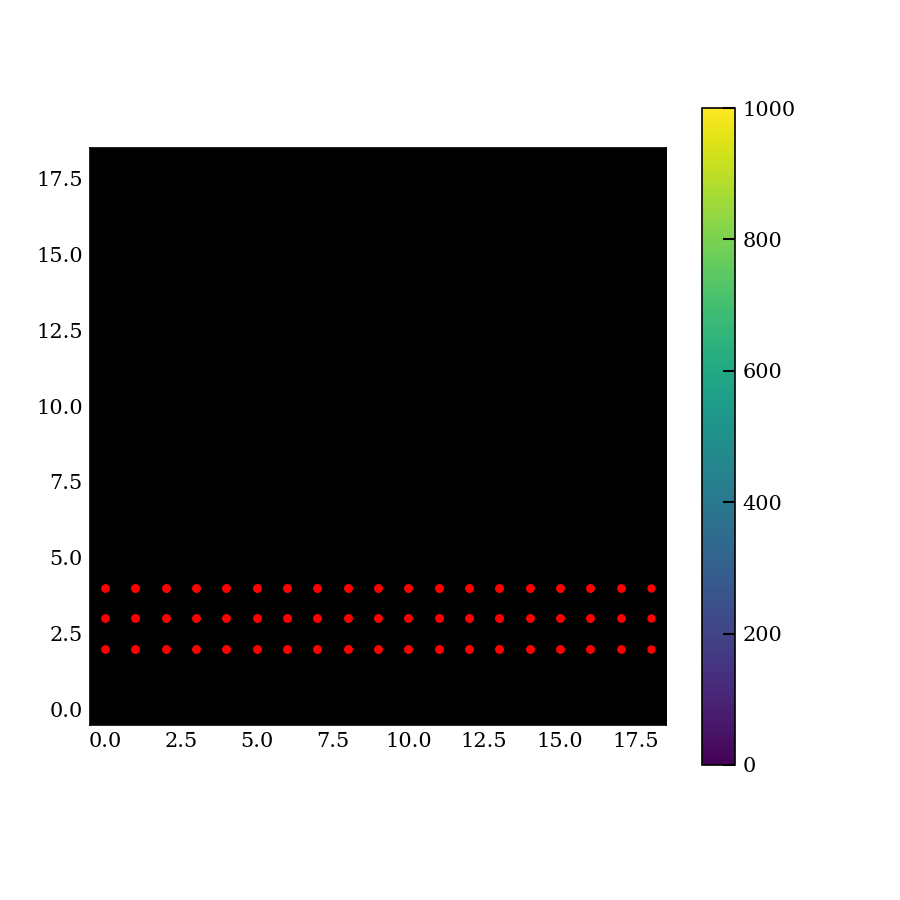

In [16]:
fig = plt.figure()#figsize=(10,10))
j=0
#thingy = np.nansum(Maskdata,axis = (1,2)) != 0
test = datacube[start:start+masktime[-1],:,:]
Maskdata2 = test#/((np.nanmedian(Maskdata, axis = (0))+3*(np.nanstd(Maskdata, axis = (0))))))>=1#[Framemin::12]
im = plt.imshow(Maskdata2[start,:,:], origin='lower',vmin=0,vmax=1000, animated=True)
kk = 0
def updatefig(*args):
    global kk
    if kk<Maskdata2.shape[0]+1:
        kk+=1
    plt.plot(np.where(astmask[kk] == 1)[1],np.where(astmask[kk] == 1)[0],'r.')    
    im.set_array(Maskdata2[kk])
    return im,

ani = animation.FuncAnimation(fig, updatefig, interval=60, blit=True)
plt.colorbar();

<IPython.core.display.Javascript object>


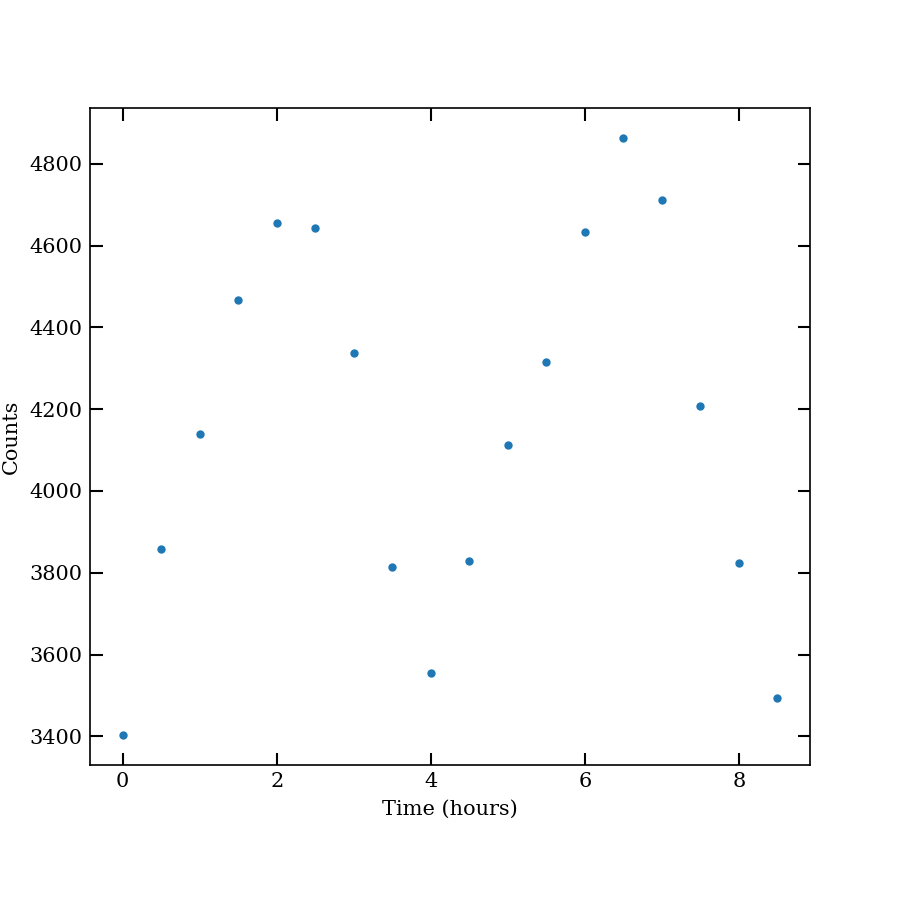

In [17]:
astlc= np.nansum(datacube[masktime]*astmask,axis=(1,2))
plt.figure()
plt.plot((masktime[:-1]-masktime[0])/2,astlc[:-1],'.')
plt.ylabel('Counts')
plt.xlabel('Time (hours)');

In [32]:
def Asteroid_move(Data, Astmask, Masktime, File, Save):
    
    height = 1100/2
    width = 2200/2
    my_dpi = 100

    FrameSave = Save + '/Figures/Frames/Asteroid/' + File.split('/')[-1].split('-')[0] + '/Event' + '/'
    Save_space(FrameSave)
    Section = Data[Masktime[0]:Masktime[-1],:,:]
    for i in range(len(Section)):
        filename = FrameSave + 'Frame_' + str(int(i)).zfill(4)+".png"
        
        fig = plt.figure(figsize=(width/my_dpi,height/my_dpi),dpi=my_dpi)
        
        plt.subplot(1, 2, 1)
        plt.title('Asteroid light curve')
        
        astlc= np.nansum(Data[Masktime]*Astmask,axis=(1,2))
        plt.plot((Masktime[:-1]-Masktime[0])/2,astlc[:-1],'-',lw=2)
        plt.plot((Masktime[:-1]-Masktime[0])/2,astlc[:-1],'x')
        plt.axvline((Masktime[i]-Masktime[0])/2, color ='red')
        plt.ylabel('Counts')
        plt.xlabel('Time (hours)');
        
        plt.subplot(1,2,2)
        plt.title('Kepler image')
        plt.imshow(Section[i,:,:], origin='lower',vmin=0,vmax=1000)

        plt.plot(np.where(Astmask[i] == 1)[1],np.where(Astmask[i] == 1)[0],'r.')    
        plt.colorbar(fraction=0.046, pad=0.04)
        plt.savefig(filename)
        
    framerate = (len(Section))/5
    directory = Save

    ffmpegcall = 'ffmpeg -y -nostats -loglevel 8 -f image2 -framerate ' + str(framerate) + ' -i ' + FrameSave + 'Frame_%04d.png -vcodec libx264 -pix_fmt yuv420p ' + directory + 'Ast-' + File.split('/')[-1].split('-')[0] + '.mp4'
    os.system(ffmpegcall);



<IPython.core.display.Javascript object>


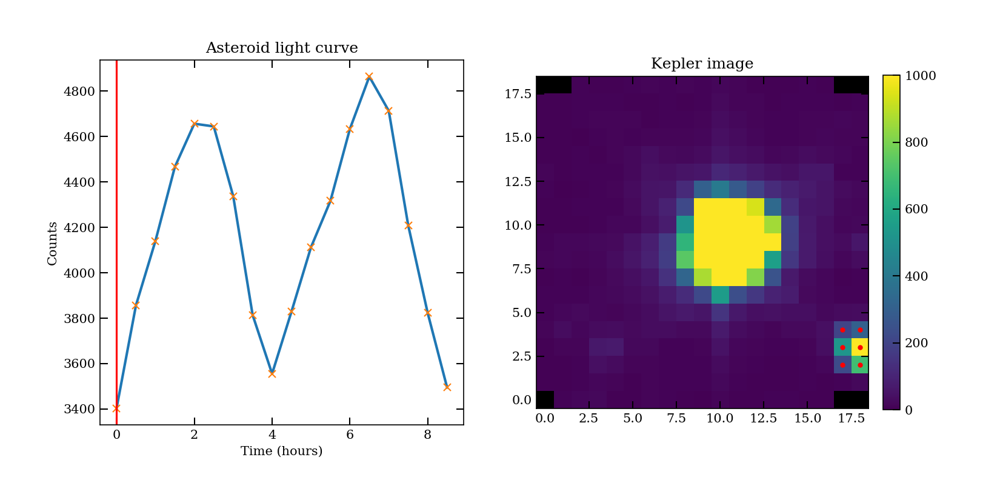

<IPython.core.display.Javascript object>


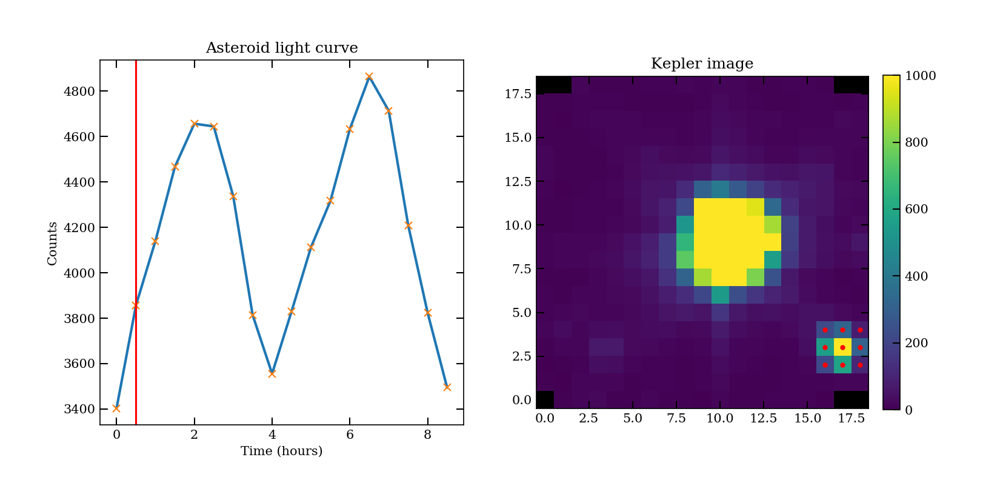

<IPython.core.display.Javascript object>


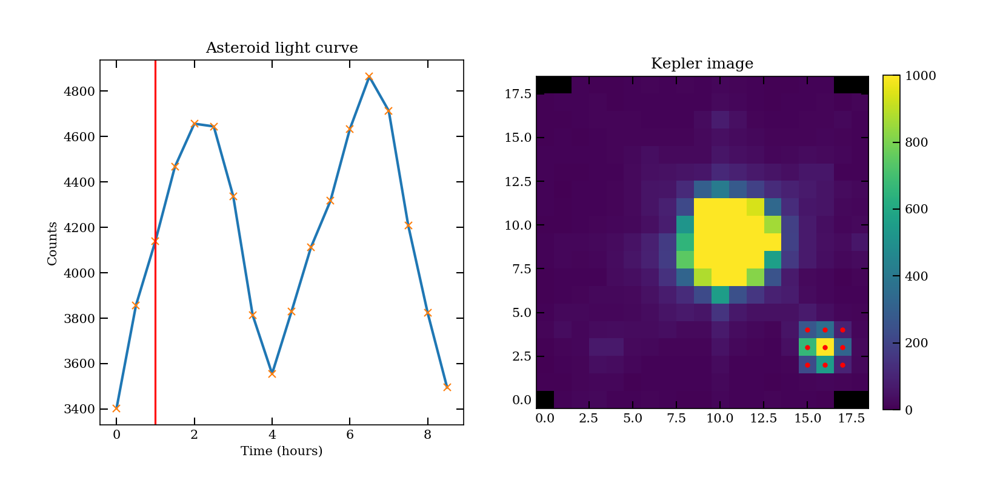

<IPython.core.display.Javascript object>


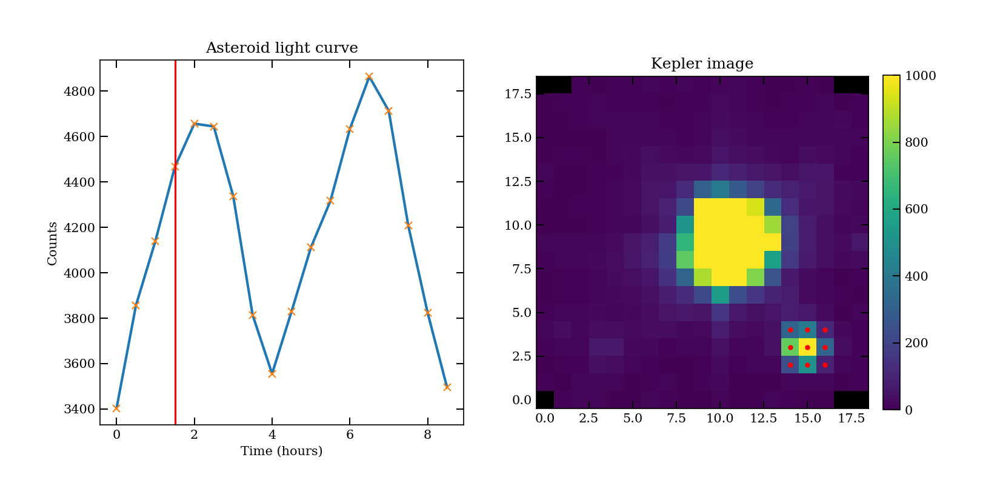

<IPython.core.display.Javascript object>


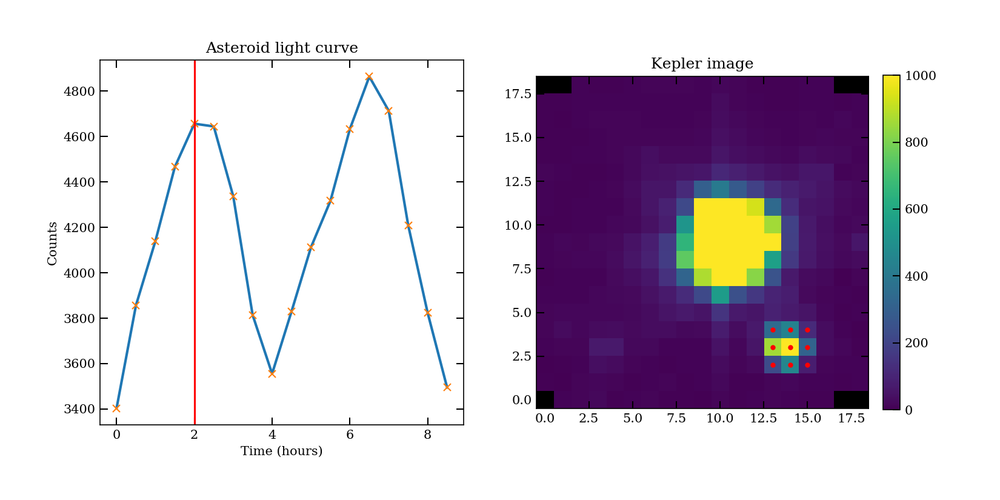

<IPython.core.display.Javascript object>


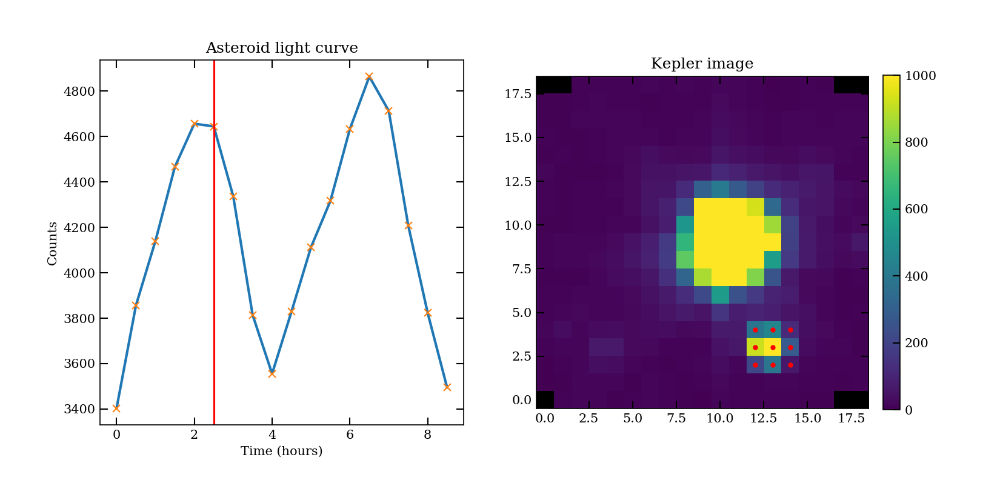

<IPython.core.display.Javascript object>


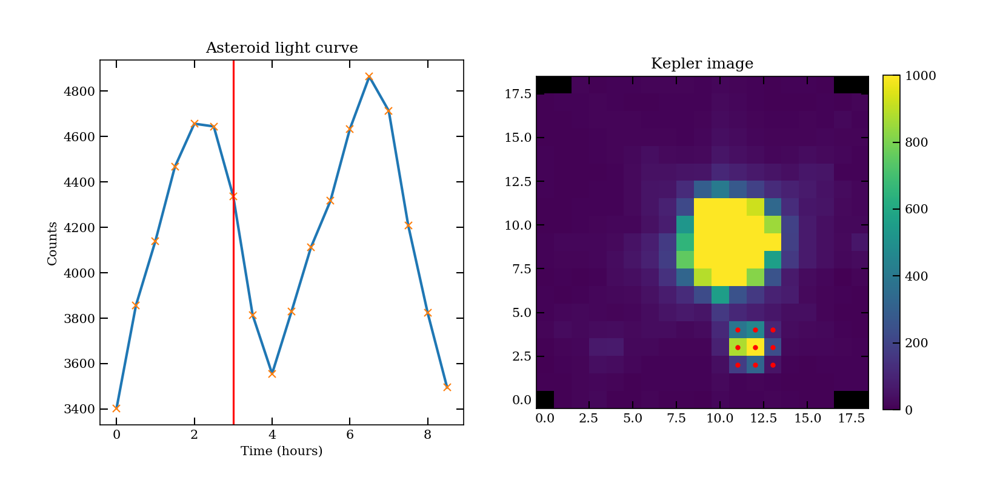

<IPython.core.display.Javascript object>


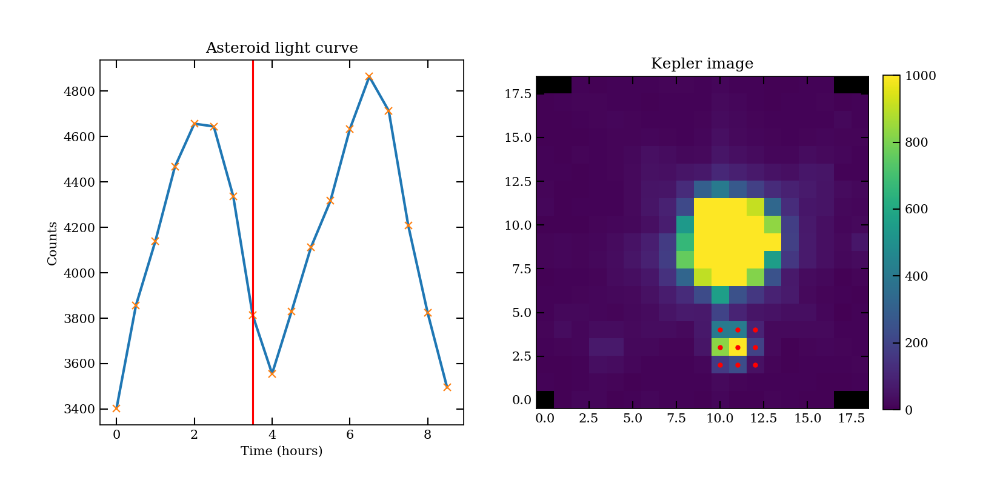

<IPython.core.display.Javascript object>


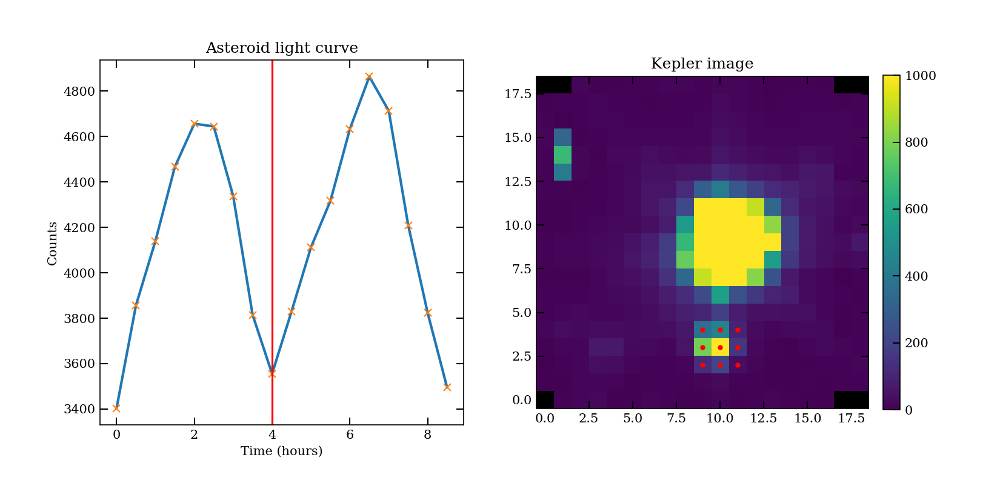

<IPython.core.display.Javascript object>


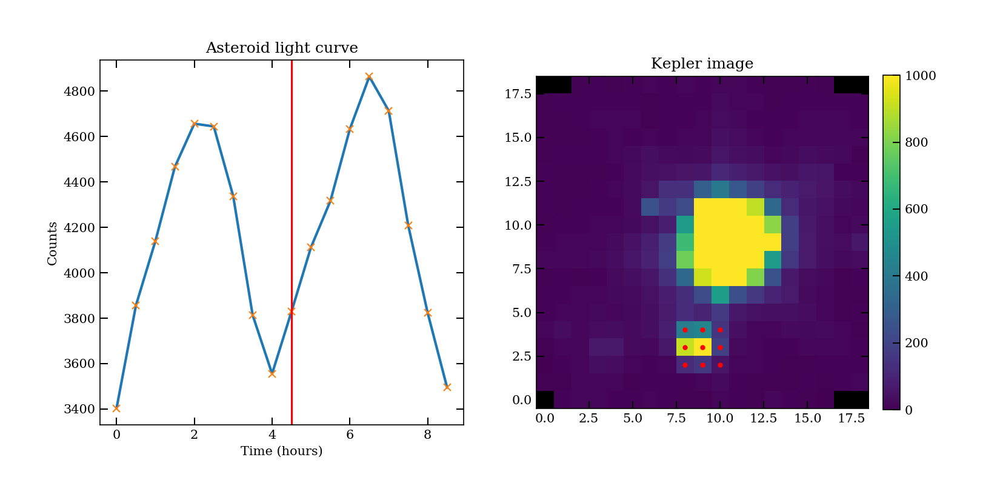

<IPython.core.display.Javascript object>


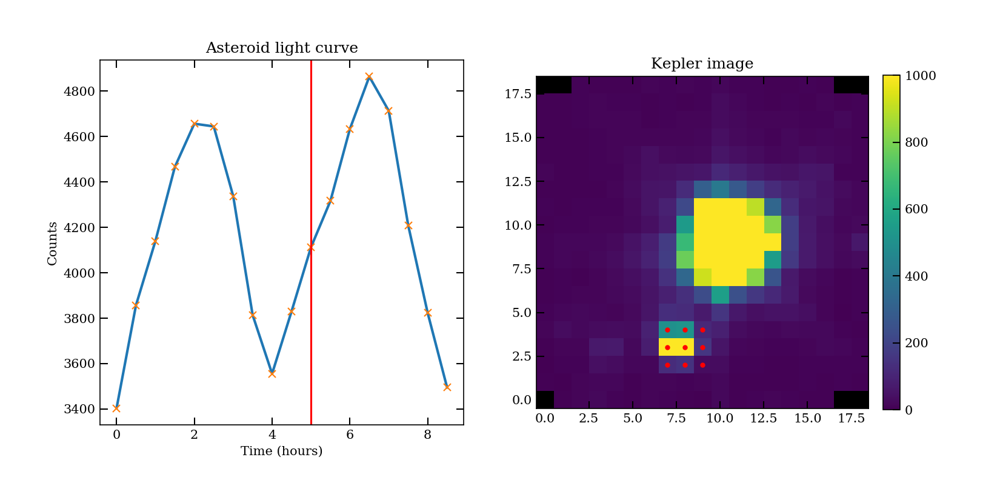

<IPython.core.display.Javascript object>


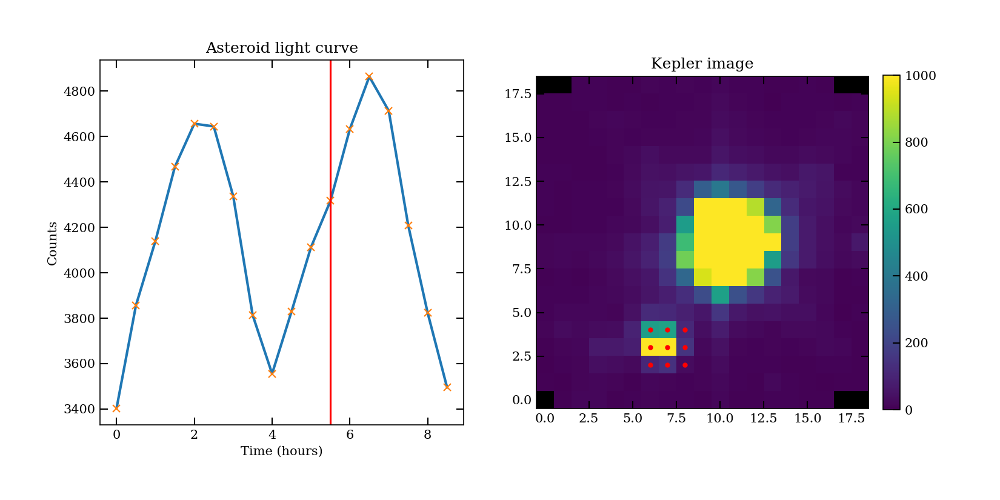

<IPython.core.display.Javascript object>


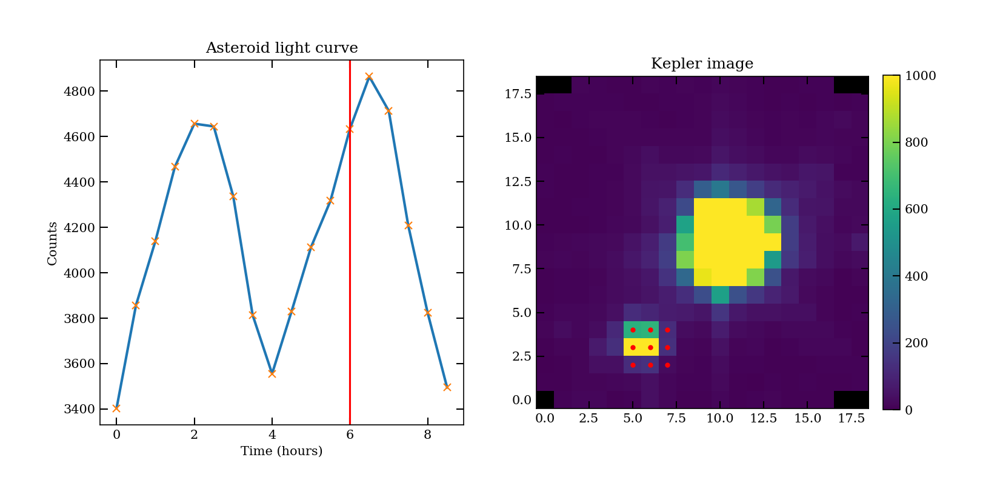

<IPython.core.display.Javascript object>


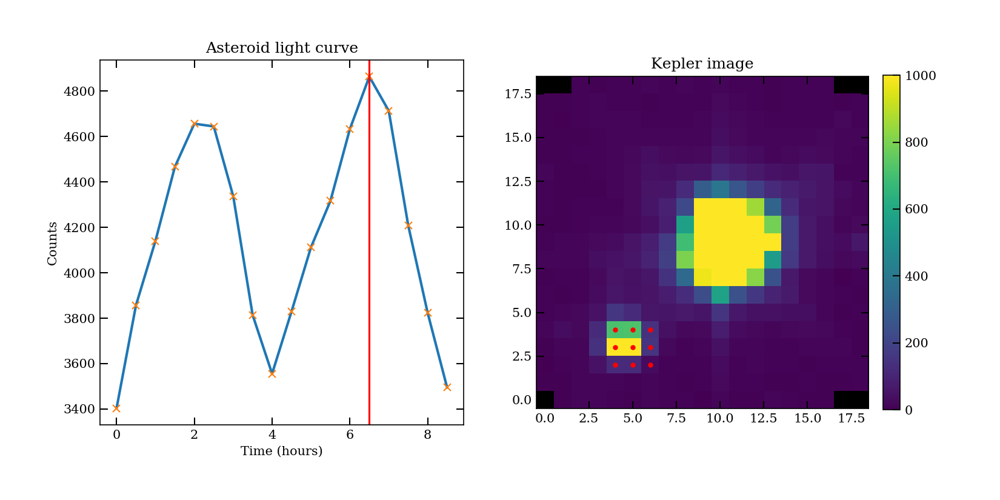

<IPython.core.display.Javascript object>


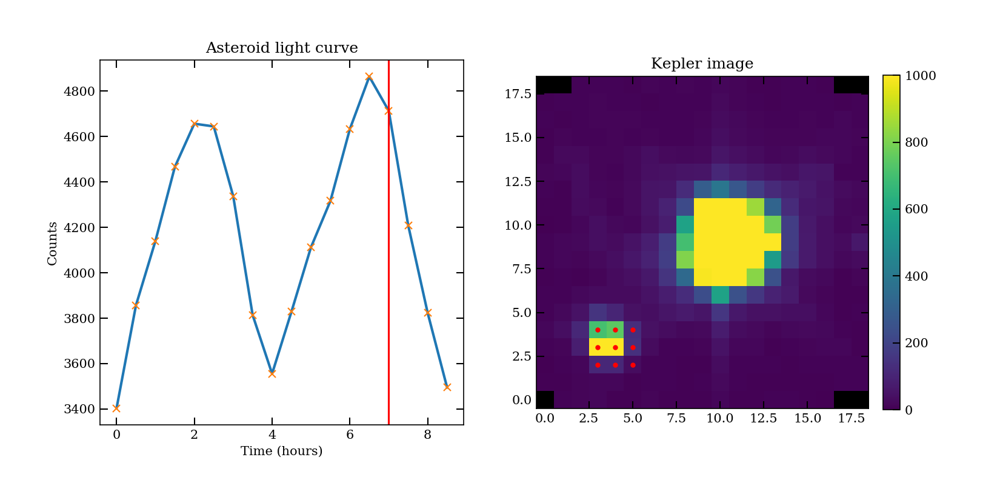

<IPython.core.display.Javascript object>


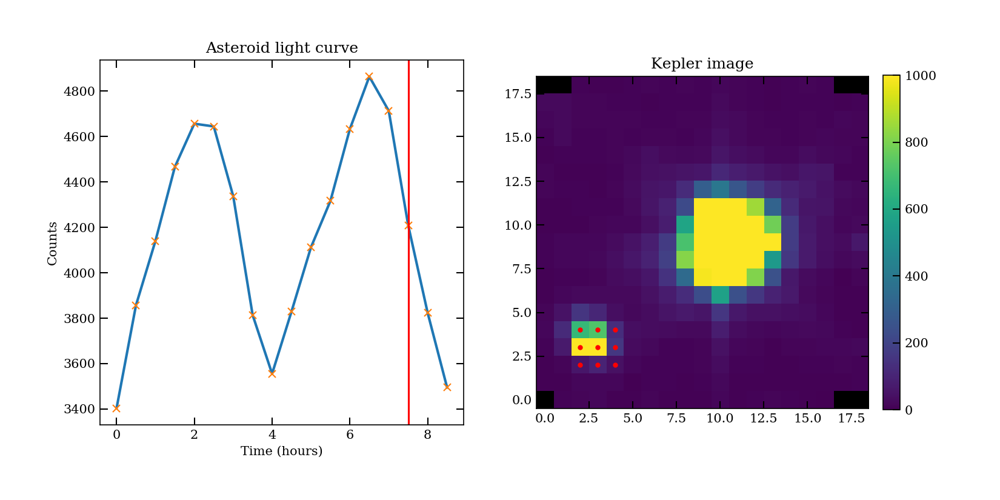

<IPython.core.display.Javascript object>


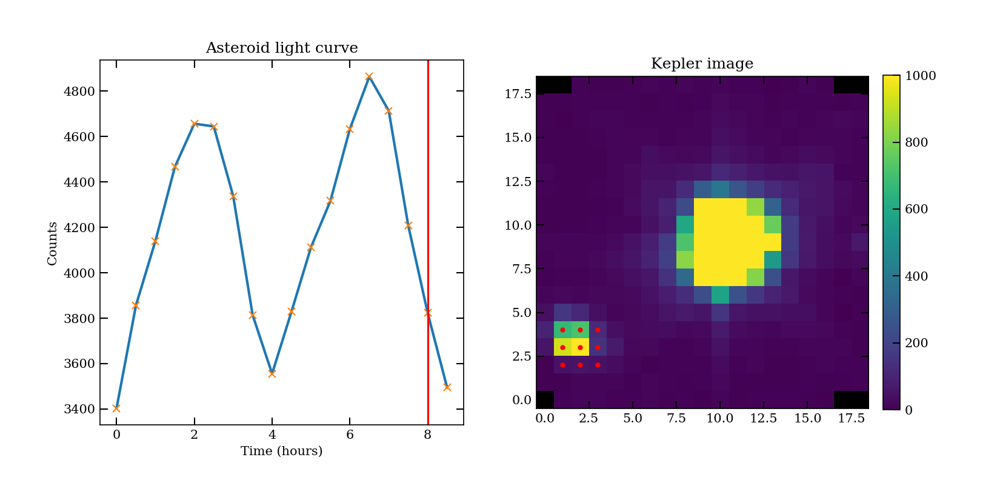

<IPython.core.display.Javascript object>


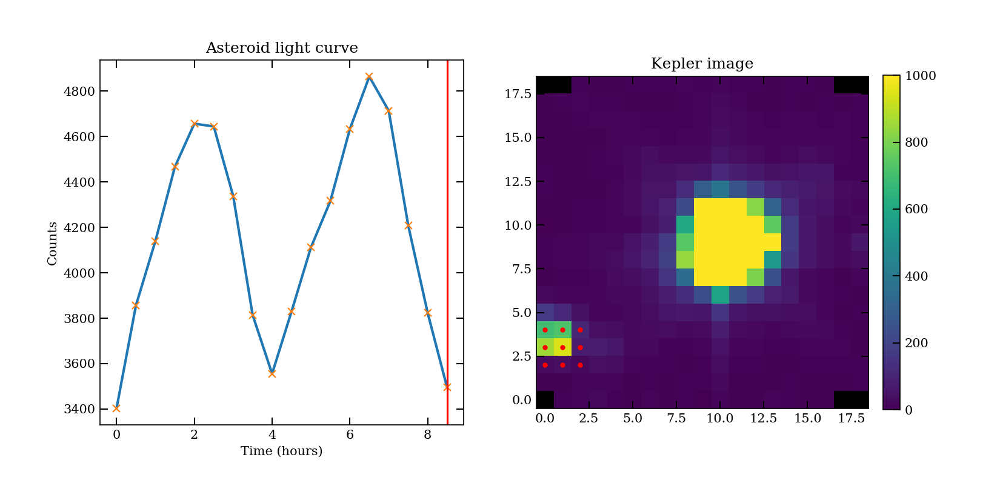

In [33]:
Asteroid_move(datacube,astmask,masktime,pixelfile,'/Users/ryanr/Documents/PhD/coding/Kepler/pipelines/Asteroid_tracker/')

Plot the light curve and mask

In [18]:
masktime

array([363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375,
       376, 377, 378, 379, 380, 381])

In [19]:
start

363

In [ ]:
def plttpf(f):
    fig, (ax1,ax2) = plt.subplots(1,2)
    
    ax1.plot((masktime[:f]-masktime[0])/2,astlc[f], 'b-')
    

    ax1.set_ylim(3500, 4700)
    #ax1.set_xlim(7, 14)
    #ax1.axvline(time[f]-time[0],color='black')
    #ax1.legend()
    ax1.set_ylabel('Counts')
    ax1.set_xlabel('Time (hours)')
    
    im = ax2.imshow(datacube[f, :,:],vmin = 0,vmax = 60,origin='lower')
    ax2.plot(np.where(eventmask[-3]==1)[1],np.where(eventmask[-3]==1)[0],'r.')
    ax2.plot(np.where(eventmask[-2]==1)[1],np.where(eventmask[-2]==1)[0],'.',color='orange')
    c = plt.colorbar(im)
    c.set_label('Counts')
    fig.set_size_inches((10,4))
    plt.savefig(save+'/wanderer/frames/'+'Frame_' + str(int(f-360)).zfill(4)+'.png')
    plt.close();

In [190]:
from astropy.time import Time

In [192]:
test = Time(time[masktime],format='jd')
bleep = test.datetime

formattime=[]
for i in range(len(bleep)):
    formattime.append(bleep[i].strftime("%Y %m %d") + '.' + str(format(int(bleep[i].strftime("%H"))/24+int(bleep[i].strftime("%M"))/(24*60)+int(bleep[i].strftime("%S"))/(24*60**2),'.5f').split('.')[-1]))          

In [193]:
formattime

['2014 06 07.17713',
 '2014 06 07.19756',
 '2014 06 07.21799',
 '2014 06 07.23843',
 '2014 06 07.25885',
 '2014 06 07.27928',
 '2014 06 07.29972',
 '2014 06 07.32015',
 '2014 06 07.34058',
 '2014 06 07.36102',
 '2014 06 07.38145',
 '2014 06 07.40188',
 '2014 06 07.42231',
 '2014 06 07.44274',
 '2014 06 07.46317']

## Formating coordinates to the type needed

In [194]:
def Deg(deg):
    if (deg < 10) & (deg > -10):
        if deg > 0:
            degstr = '+0'+str(deg)
        else:
            degstr = '-0'+str(deg)
    else:
        if deg > 0:
            degstr = '+'+str(deg)
        else:
            degstr = '-'+str(deg)
    return degstr
    
def Minutes(minutes):
    if (minutes < 10) & (minutes > -10):
        minstr = '0'+str(minutes)
    else:
        minstr = str(minutes)
    return minstr

def Seconds(sec):
    if (sec < 10) & (sec > -10):
        secstr = '0'+str(format(sec,'.2f'))
    else:
        secstr = str(format(sec,'.2f'))
    return secstr

In [197]:
realcoord = np.zeros((len(astpos),2))
for i in range(len(astpos)):
    realcoord[i] = pix2coord(astpos[i,1],astpos[i,0],mywcs)

In [199]:
c = SkyCoord(realcoord[:,0], realcoord[:,1], frame='icrs', unit='deg')
RA = []
DEC = []
for i in range(len(realcoord)):
    RA.append(Minutes(int(c.ra.hms[0][i]))+' '+Minutes(int(c.ra.hms[1][i]))+' '+Seconds(c.ra.hms[2][i]))
    DEC.append(Deg(int(c.dec.dms[0][i]))+' '+Minutes(int(c.dec.dms[1][i]))+' '+Seconds(c.dec.dms[2][i]))
    

In [200]:
DEC

['+04 14 57.04',
 '+04 14 57.59',
 '+04 14 58.14',
 '+04 14 58.68',
 '+04 14 59.22',
 '+04 14 59.76',
 '+04 15 00.36',
 '+04 15 00.93',
 '+04 15 01.53',
 '+04 15 02.07',
 '+04 15 02.67',
 '+04 15 03.19',
 '+04 15 03.69',
 '+04 15 04.14',
 '+04 15 06.15']

In [201]:
RA

['11 45 22.68',
 '11 45 22.41',
 '11 45 22.15',
 '11 45 21.87',
 '11 45 21.61',
 '11 45 21.35',
 '11 45 21.07',
 '11 45 20.80',
 '11 45 20.53',
 '11 45 20.27',
 '11 45 20.01',
 '11 45 19.75',
 '11 45 19.49',
 '11 45 19.21',
 '11 45 19.07']

In [9]:
epoc = time[eventtime[3,0]]
ra = pix2coord(14,3,mywcs)[0]
dec = pix2coord(14,3,mywcs)[1]

In [7]:
pix2coord(14,3,mywcs)

array([ 176.34473884,    4.24917632])

# Database check

In [11]:
'http://vo.imcce.fr/webservices/skybot/skybotconesearch_query.php?[EPOC='+str(epoc)+'&RA='+str(ra)+'&DEC='+str(dec)+'&SR=10&VERB=1'+'&-loc=kepler]'


'http://vo.imcce.fr/webservices/skybot/skybotconesearch_query.php?[EPOC=2456815.63627&RA=176.344738841&DEC=4.24917631854&SR=10&VERB=1&-loc=kepler]'

In [15]:
url_path(ra,dec,epoc,10)

'http://vo.imcce.fr/webservices/skybot/skybotconesearch_query.php?EPOCH=2456815.636265978&RA=176.34473884055717&DEC=4.249176318543639&SR=10&VERB=1&-loc=kepler'

In [53]:
from astropy.table import Table
from urllib.request import urlopen
import urllib.error as urlerror

def url_path(ra, dec, epoch, sr):
    url = "http://vo.imcce.fr/webservices/skybot/skybotconesearch_query.php?EPOCH={}&RA={}&DEC={}&SR={}&VERB=1&-loc=kepler".format(epoch, ra,dec, sr)

    return url

def read_table(urlpath):
    try:
        t = Table.read(urlpath)
        return t[0]['name'], t[0]['num']
    except ValueError:
        return "NOTFOUND", "NOTFOUND"
    except (urlerror.URLError,TimeoutError) as e:
        return 'NOTFOUND', 'NOTFOUND'

def check_catalog(ra, dec, epoch, searchRadius):
    url = url_path(ra, dec, epoch, searchRadius)
    catalogName, catalogNum = read_table(url)
    return catalogName, catalogNum

In [54]:
Name, Number = check_catalog(ra,dec,epoc,20)

In [55]:
def Asteroid_checker(astpos,asttime):
    for i in range(len(astpos)):
        
        check_catalog()

'NOTFOUND'